In [1]:
import pickle
import numpy as np
%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import toeplitz
from mpl_toolkits.mplot3d import Axes3D
from static_1Dfunction import *
from IPython.display import display, HTML
from matplotlib import cm
import seaborn
import matplotlib
from matplotlib.gridspec import GridSpec

display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
#import
dir_name=['hom','n=1','n=2','n=3','n=4','n=5','n=6','n=7','n=8','n=9','n=1alt','n=2bis','n=3bis_1','n=3bis_2','n=4bis_1','n=4bis_2','n=4bis_3']
name_mode=['Homogeneous solution','n=1','n=2','n=3','n=4','n=5','n=6','n=7','n=8','n=9','n=1 alternative','n=2 bis','n=3 bis_1','n=3 bis_2','n=4 bis_1','n=4bis_2','n=4bis_3']

P_mode_tot=[]
W_mode_tot=[]
O_mode_tot=[]
Rains_mode_tot=[]
Stab_mode_tot=[]
Lmb_mode_tot=[]

for i in range(len(dir_name)):
    #print('Saving files for '+dir_name[i])
    with open("L100/"+dir_name[i]+"/P_mode_tot.txt", "rb") as fp:
        P_mode_tot.append(pickle.load(fp))
    with open("L100/"+dir_name[i]+"/W_mode_tot.txt", "rb") as fp:
        W_mode_tot.append(pickle.load(fp))
    with open("L100/"+dir_name[i]+"/O_mode_tot.txt", "rb") as fp:
        O_mode_tot.append(pickle.load(fp))
    with open("L100/"+dir_name[i]+"/Rains_mode_tot.txt", "rb") as fp:
        Rains_mode_tot.append(pickle.load(fp))
    with open("L100/"+dir_name[i]+"/Stab_mode_tot.txt", "rb") as fp:
        Stab_mode_tot.append(pickle.load(fp))
    with open("L100/"+dir_name[i]+"/Lmb_mode_tot.txt", "rb") as fp:
        Lmb_mode_tot.append(pickle.load(fp))
         
   
with open("L100/param.txt", "rb") as fp:   
    param = pickle.load(fp)


N_mode=len(P_mode_tot)
print(N_mode)

17


In [3]:

# Colorblind 
color_mode=[]
color_mode.append('black')
seaborn.color_palette("colorblind")
for i in range(10):
    color_mode.append(seaborn.color_palette("colorblind")[i])

color_mode.append(seaborn.color_palette("dark")[1])
color_mode.append(seaborn.color_palette("dark")[2]) 
color_mode.append(seaborn.color_palette("dark")[3])  
color_mode.append(seaborn.color_palette("dark")[4])  
color_mode.append(seaborn.color_palette("dark")[5])
color_mode.append(seaborn.color_palette("dark")[6])



# Homogeneous solution

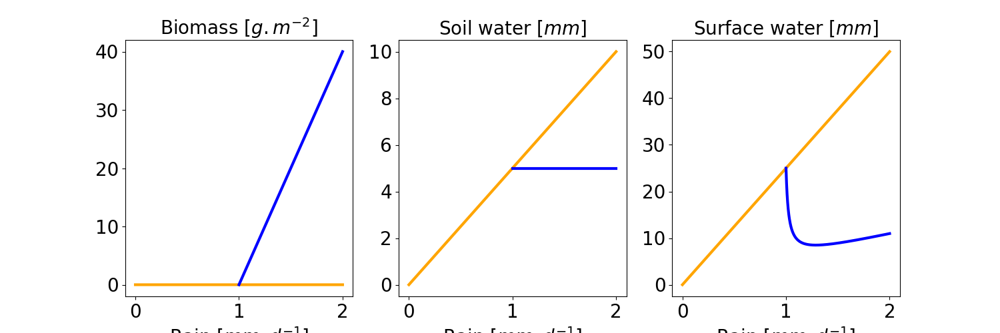

In [14]:
N1=2001
Rain_1=np.linspace(0,2,N1)

P_hom_1=np.zeros((N1))
W_hom_1=Rain_1*np.ones((N1))/param['rw']
O_hom_1=Rain_1*np.ones((N1))/(param['w0']*param['alpha'])
                        
                            
N2=1001
Rain_2=np.linspace(1,2,N2)
P_hom_2=param['c']*((Rain_2/param['d'])-((param['k1']*param['rw'])/((param['c']*param['gmax']-param['d']))))
W_hom_2=(param['d']*param['k1'])/(param['c']*param['gmax']-param['d'])*np.ones(N2)
O_hom_2=Rain_2*((param['c']*param['gmax']-param['d'])*(param['c']*Rain_2+param['d']*param['k2'])-param['c']*param['d']*param['k1']*param['rw'])/(param['alpha']*((param['c']*param['gmax']-param['d'])*(param['c']*Rain_2+param['d']*param['k2']*param['w0'])-param['c']*param['d']*param['k1']*param['rw']))
#O_hom_2=(Rain_2*(-4.375 + 5.0*Rain_2))/(-0.975 + Rain_2)

fig,axes=plt.subplots(1,3,figsize=(15,5))

axes[0].plot(Rain_1,P_hom_1,color='orange',linewidth=3)
axes[0].plot(Rain_2,P_hom_2,color='blue',linewidth=3)
axes[1].plot(Rain_1,W_hom_1,color='orange',linewidth=3)
axes[1].plot(Rain_2,W_hom_2,color='blue',linewidth=3)
axes[2].plot(Rain_1,O_hom_1,color='orange',linewidth=3)
axes[2].plot(Rain_2,O_hom_2,color='blue',linewidth=3)
axes[0].set_title('Biomass $[g.m^{-2}]$',fontsize=20)
axes[0].set_xlabel('Rain $[mm.d^{-1}$]',fontsize=20)
axes[1].set_title('Soil water $[mm]$',fontsize=20)
axes[1].set_xlabel('Rain $[mm.d^{-1}$]',fontsize=20)
axes[2].set_title('Surface water $[mm]$',fontsize=20)
axes[2].set_xlabel('Rain $[mm.d^{-1}$]',fontsize=20)
axes[0].tick_params(axis='both', which='major', labelsize=20)
axes[1].tick_params(axis='both', which='major', labelsize=20)
axes[2].tick_params(axis='both', which='major', labelsize=20)


fig.savefig('figure/Homogeneous.pdf',bbox_inches='tight')

# Contour of $\Omega$

Number of points in the x-axis: 1->1.3 with dR=0.001 now before 0.005
Number of points in the y-axis: (kappa)140/ deux fois ca 281?

[[1.    1.    1.    1.    1.   ]
 [1.005 1.005 1.005 1.005 1.005]
 [1.01  1.01  1.01  1.01  1.01 ]
 [1.015 1.015 1.015 1.015 1.015]
 [1.02  1.02  1.02  1.02  1.02 ]]
[[0.    0.005 0.01  0.015 0.02 ]
 [0.    0.005 0.01  0.015 0.02 ]
 [0.    0.005 0.01  0.015 0.02 ]
 [0.    0.005 0.01  0.015 0.02 ]
 [0.    0.005 0.01  0.015 0.02 ]]
[[-2.25983281e-05 -2.35027902e-05 -2.71741188e-05 -3.53299213e-05
  -4.90400202e-05]
 [-9.91854989e-04  2.75152838e-04  2.80926705e-03  5.24132198e-03
   7.19371017e-03]
 [-2.81535597e-03 -5.34693075e-05  4.43302581e-03  8.29267132e-03
   1.12963912e-02]
 [-6.00212644e-03 -1.02009119e-03  5.02286642e-03  9.81998582e-03
   1.34981972e-02]
 [            nan -2.52974358e-03  4.87581638e-03  1.03617038e-02
   1.45288494e-02]]


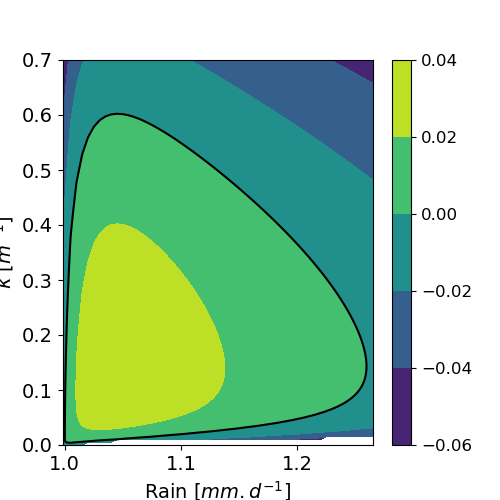

In [9]:
omega=np.loadtxt('omega_data.dat')



R=np.reshape(omega[:,0],(61,141))
Kappa=np.reshape(omega[:,1],(61,141))
Omega=np.reshape(omega[:,2],(61,141))
print(R[:5,:5])
print(Kappa[:5,:5])
print(Omega[:5,:5])



fig,ax=plt.subplots(1,1,figsize=(5,5))
c=np.linspace(np.nanmin(Omega),np.nanmax(Omega),1001)
c=np.array([-0.06,-0.04,-0.02,0,0.02,0.04])
Ax1=ax.contourf(R,Kappa,Omega,levels=c)
c=np.array([0])
Ax2=ax.contour(Ax1,levels=c,colors=('k',))
#ax.clabel(Ax2, fmt='%2.1f', colors='w', fontsize=14)
ax.set_xlabel('Rain $[mm.d^{-1}$]',fontsize=14)
ax.set_ylabel(r'$\kappa$ $[m^{-1}$]',fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=14)

plt.colorbar(Ax1)
ax.set_xlim((0.998,1.265))
fig.savefig('figure/eigen.pdf',bbox_inches='tight')

(2604, 7)


/opt/easybuild/soft/2021b/software/SciPy-bundle/2021.10-foss-2021b/lib/python3.9/site-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


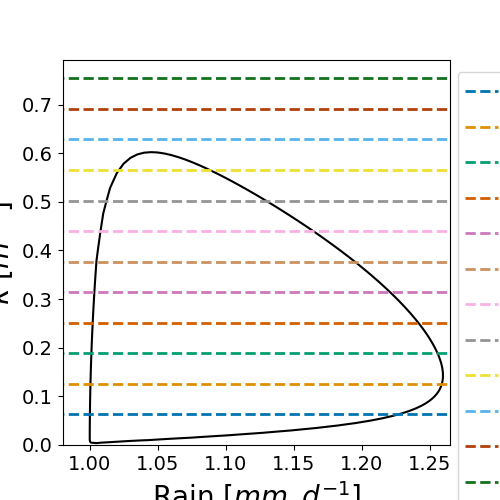

In [13]:
kappa=np.flip(np.loadtxt('Guesses.dat'),axis=0)
print(kappa.shape)
L=100
plt.rc('font', size=12) 
fig=plt.figure(figsize=(5,5))
ax=fig.add_subplot(1,1,1)
#ax.fill_between(kappa[:,0],kappa[:,1],kappa[:,2],hatch='\\',edgecolor='b',facecolor='none',label='$\Omega >0$')
#ax.plot(kappa[:,0],kappa[:,1],'k')
#ax.plot(kappa[:,0],kappa[:,2],'k')
c=np.array([0])
Ax2=ax.contour(R,Kappa,Omega,levels=c,colors=('k',))
ax.set_xlabel('Rain $[mm.d^{-1}$]',fontsize=20)
ax.set_ylabel(r'$\kappa$ $[m^{-1}$]',fontsize=20)
for i in range(np.shape(color_mode)[0]-5):
    y=(i+1)*2*np.pi/L
    ax.hlines(y,0.8,1.5,color_mode[i+1],label=r'$\kappa=$ %d $\frac{2 \pi}{L}$'%(i+1),linestyle='dashed',linewidth=2)
ax.legend(bbox_to_anchor=(1.4,0.99))
ax.set_xlim((0.98,1.265))
ax.tick_params(axis='both', which='major', labelsize=14)

fig.savefig('figure/zeroModesL100.pdf',bbox_inches='tight')

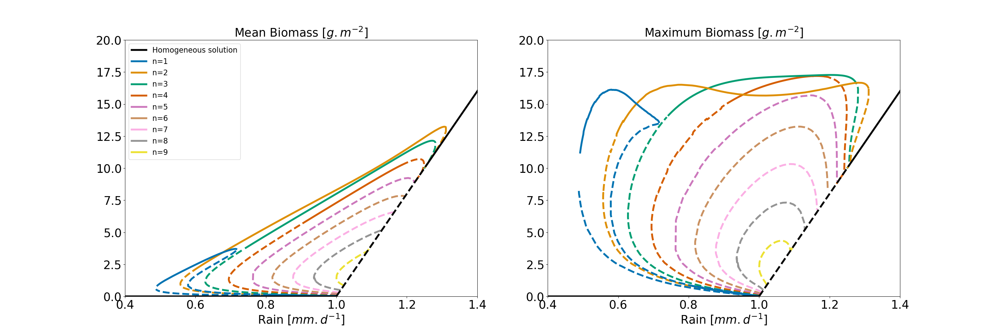

In [7]:
plt.rc('font', size=12) 
Zorder=-np.arange(0,N_mode)
fig,ax=plt.subplots(1,2,figsize=(30,10))
for i in range(N_mode-7):
    ax[0].plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i],zorder=Zorder[i],linewidth=4)
    ax[0].plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=4,color=color_mode[i],label=name_mode[i],linestyle='solid',zorder=Zorder[i],linewidth=4)
    ax[1].plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.max(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i],zorder=Zorder[i],linewidth=4)
    ax[1].plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.max(P_mode_tot[i],axis=1)),markersize=2,color=color_mode[i],label=name_mode[i],zorder=Zorder[i],linewidth=4)
ax[0].set_xlim(0.4,1.4)
ax[0].set_ylim(0,20)
ax[0].set_title('Mean Biomass $[g.m^{-2}]$',fontsize=25)
ax[0].set_xlabel('Rain $[mm.d^{-1}]$',fontsize=25)
ax[0].legend(fontsize=16)
ax[1].set_xlim(0.4,1.4)
ax[1].set_ylim(0,20)
ax[1].set_title('Maximum Biomass $[g.m^{-2}]$',fontsize=25)
ax[1].set_xlabel('Rain $[mm.d^{-1}$]',fontsize=25)
ax[0].tick_params(axis='both', which='major', labelsize=25)
ax[1].tick_params(axis='both', which='major', labelsize=25)

#ax[1].legend()
plt.savefig('figure/bif_diag_100.pdf',dpi=500,bbox_inches='tight')

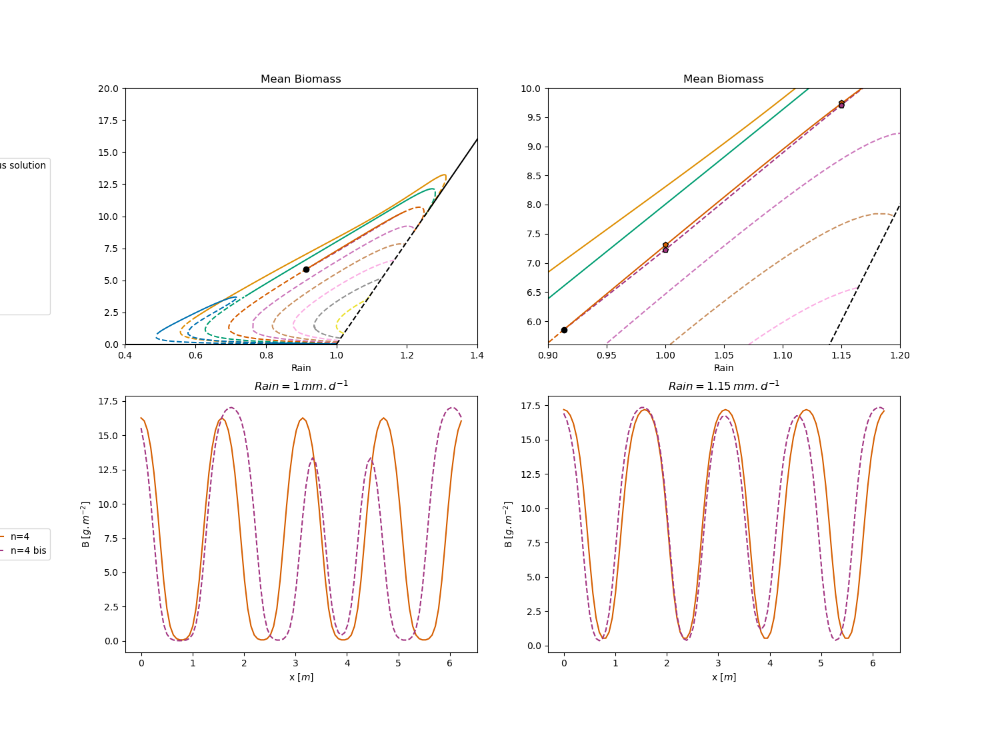

In [4]:
#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)
Zorder=-np.arange(0,N_mode)
fig,ax=plt.subplots(2,2,figsize=(15,11))
a=[0,1,2,3,4,5,6,7,8,9]
bot=0
for i in a:
    ax[0,0].plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i],zorder=Zorder[i])
    ax[0,0].plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=4,color=color_mode[i],label=name_mode[i],linestyle='solid',zorder=Zorder[i]) 
    ax[0,1].plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i],zorder=Zorder[i])
    ax[0,1].plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=4,color=color_mode[i],label=name_mode[i],linestyle='solid',zorder=Zorder[i]) 
ax[0,0].plot(np.ma.masked_where(True^Stab_mode_tot[N_mode-1], Rains_mode_tot[N_mode-1]),np.ma.masked_where(True^Stab_mode_tot[N_mode-1][bot:], np.mean(P_mode_tot[N_mode-1],axis=1)),linestyle='dashed',markersize=1,color=color_mode[N_mode-1],zorder=Zorder[N_mode-1])
ax[0,0].plot(np.ma.masked_where(Stab_mode_tot[N_mode-1], Rains_mode_tot[N_mode-1]),np.ma.masked_where(Stab_mode_tot[N_mode-1], np.mean(P_mode_tot[N_mode-1],axis=1)),markersize=4,color=color_mode[N_mode-1],label=name_mode[N_mode-1],linestyle='solid',zorder=Zorder[i])
ax[0,1].plot(np.ma.masked_where(True^Stab_mode_tot[N_mode-1], Rains_mode_tot[N_mode-1]),np.ma.masked_where(True^Stab_mode_tot[N_mode-1][bot:], np.mean(P_mode_tot[N_mode-1],axis=1)),linestyle='dashed',markersize=1,color=color_mode[N_mode-1],zorder=Zorder[N_mode-1])
ax[0,1].plot(np.ma.masked_where(Stab_mode_tot[N_mode-1], Rains_mode_tot[N_mode-1]),np.ma.masked_where(Stab_mode_tot[N_mode-1], np.mean(P_mode_tot[N_mode-1],axis=1)),markersize=4,color=color_mode[N_mode-1],label=name_mode[N_mode-1],linestyle='solid',zorder=Zorder[i])

ax[0,0].plot(Rains_mode_tot[N_mode-1][0],np.mean(P_mode_tot[N_mode-1][0]),marker='o',color='black')
ax[0,1].plot(Rains_mode_tot[N_mode-1][0],np.mean(P_mode_tot[N_mode-1][0]),marker='o',color='black')
#Find the solution to show along the branches 
rain1=1
n_mode=4
ind_01=selec_rain(rain1,5,10,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
n_mode=N_mode-1
ind_11=selec_rain(rain1,5,10,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
rain2=1.15
n_mode=4
ind_02=selec_rain(rain2,5,10,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
n_mode=N_mode-1
ind_12=selec_rain(rain2,5,10,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]

ind=[]
for i in range(4):
    ind.append()

ax[0,1].scatter(rain1,np.mean(P_mode_tot[4][ind_01]),marker='p',color=color_mode[4],edgecolors= "black")
ax[0,1].scatter(rain2,np.mean(P_mode_tot[4][ind_02]),marker='p',color=color_mode[4],edgecolors= "black")
ax[0,1].scatter(rain1,np.mean(P_mode_tot[N_mode-1][ind_11]),marker='p',color=color_mode[N_mode-1],edgecolors= "black")
ax[0,1].scatter(rain2,np.mean(P_mode_tot[N_mode-1][ind_12]),marker='p',color=color_mode[N_mode-1],edgecolors= "black")

ax[0,0].legend(bbox_to_anchor=(-0.2,0.1))
ax[0,0].set_xlim(0.4,1.4)
ax[0,0].set_ylim(0,20)
ax[0,0].set_title('Mean Biomass')
ax[0,0].set_xlabel('Rain')
ax[0,1].set_xlim(0.9,1.2)
ax[0,1].set_ylim(5.6,10)
ax[0,1].set_title('Mean Biomass')
ax[0,1].set_xlabel('Rain')
ax[1,0].plot(x,P_mode_tot[4][ind_01],color=color_mode[4],label='n=4')
ax[1,0].plot(x,P_mode_tot[N_mode-1][ind_11],color=color_mode[N_mode-1],linestyle='dashed',label='n=4 bis')
ax[1,1].plot(x,P_mode_tot[4][ind_02],color=color_mode[4],label='n=4')
ax[1,1].plot(x,P_mode_tot[N_mode-1][ind_12],color=color_mode[N_mode-1],linestyle='dashed',label='n=4 bis')

ax[1,0].legend(bbox_to_anchor=(-0.2,0.5))

ax[1,0].set_title('$Rain = 1 \, mm.d^{-1}$')
ax[1,0].set_xlabel('x $[m]$')
ax[1,0].set_ylabel('B $[g.m^{-2}]$')
ax[1,1].set_title('$Rain = 1.15 \, mm.d^{-1}$')
ax[1,1].set_xlabel('x $[m]$')
ax[1,1].set_ylabel('B $[g.m^{-2}]$')

#ax[0,0].tick_params(axis='both', which='major', labelsize=14)

plt.savefig('figure/MState.pdf',dpi=500,bbox_inches='tight')

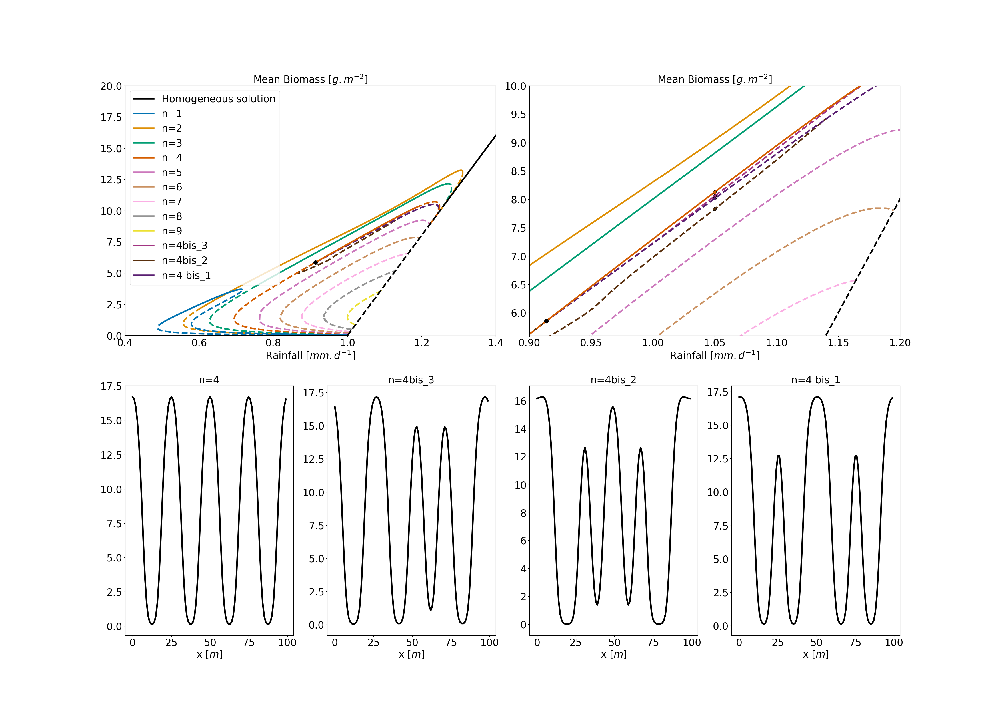

In [15]:
#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)*(L/(2*np.pi))
Zorder=-np.arange(0,N_mode)

fig=plt.figure(figsize=(35,25))
#fig.suptitle('L= %.1f m, R = %.2f'%(L,rain),fontsize=16)
gs = GridSpec(2, 4, width_ratios=[2, 2, 2,2], height_ratios=[1, 1])
# Create axes for the first row
ax1 = plt.subplot(gs[0, 0:2])
ax2 = plt.subplot(gs[0, 2:4])

# Create axes for the second row
ax3 = plt.subplot(gs[1, 0])
ax4 = plt.subplot(gs[1, 1])
ax5 = plt.subplot(gs[1, 2])
ax6 = plt.subplot(gs[1, 3])

a=[0,1,2,3,4,5,6,7,8,9,-1,-2,-3]
bot=0
for i in a:
    ax1.plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i],zorder=Zorder[i],linewidth=4)
    ax1.plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=4,color=color_mode[i],label=name_mode[i],linestyle='solid',zorder=Zorder[i],linewidth=4) 
    ax2.plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i],zorder=Zorder[i],linewidth=4)
    ax2.plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=4,color=color_mode[i],label=name_mode[i],linestyle='solid',zorder=Zorder[i],linewidth=4) 

ax1.plot(Rains_mode_tot[N_mode-1][0],np.mean(P_mode_tot[N_mode-1][0]),marker='o',color='black',markersize=10)
ax2.plot(Rains_mode_tot[N_mode-1][0],np.mean(P_mode_tot[N_mode-1][0]),marker='o',color='black',markersize=10)
#Find the solution to show along the branches 
#Mix_mode=N_mode-1
#rain1=1
#n_mode=4
#ind_01=selec_rain(rain1,5,10,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
#n_mode=Mix_mode
#ind_11=selec_rain(rain1,5,10,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
#rain2=1.08
#n_mode=4
#ind_02=selec_rain(rain2,5,10,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
#n_mode=Mix_mode
#ind_12=selec_rain(rain2,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]


rain=1.05
n_mode=[4,-1,-2,-3]
Equil=[]
for i in range(4):
    Equil.append(find_next_solution(rain,n_mode[i],5,10,L,param,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot))

#P_4bis_perm2=period_perm(P_4bis,72)



axs=[ax3,ax4,ax5,ax6]
for i in range(4):
    axs[i].plot(x,Equil[i][1],color='black',linewidth=4)
    axs[i].set_xlabel('x $[m]$',fontsize=25)
    axs[i].set_title(name_mode[n_mode[i]],fontsize=25)
    ax2.scatter(rain,np.mean(Equil[i][1]),marker='p',s=100,color=color_mode[n_mode[i]],edgecolors= "black")
  
ax1.legend(bbox_to_anchor=(-0.10,0.9),fontsize=25)
ax1.legend(fontsize=25)
ax1.set_xlim(0.4,1.4)
ax1.set_ylim(0,20)
ax1.set_title('Mean Biomass $[g.m^{-2}]$',fontsize=25)
ax1.set_xlabel('Rainfall $[mm.d^{-1}]$',fontsize=25)
ax2.set_xlim(0.9,1.2)
ax2.set_ylim(5.6,10)
ax2.set_title('Mean Biomass $[g.m^{-2}]$',fontsize=25)
ax2.set_xlabel('Rainfall $[mm.d^{-1}]$',fontsize=25)
#ax[1,0].plot(x,P_mode_tot[4][ind_01],color=color_mode[4],label='n=4')
#ax[1,0].plot(x,P_mode_tot[Mix_mode][ind_11],color=color_mode[Mix_mode],linestyle='dashed',label=name_mode[-1])
#ax[1,1].plot(x,P_mode_tot[4][ind_02],color=color_mode[4],label='n=4')
#ax[1,1].plot(x,P_mode_tot[Mix_mode][ind_12],color=color_mode[Mix_mode],linestyle='dashed',label=name_mode[-1])

ax1.tick_params(axis='both', which='major', labelsize=25)
ax2.tick_params(axis='both', which='major', labelsize=25)
ax3.tick_params(axis='both', which='major', labelsize=25)
ax4.tick_params(axis='both', which='major', labelsize=25)
ax5.tick_params(axis='both', which='major', labelsize=25)
ax6.tick_params(axis='both', which='major', labelsize=25)


plt.savefig('figure/MState2.pdf',dpi=500,bbox_inches='tight')

100
100


/opt/easybuild/soft/2021b/software/matplotlib/3.4.3-foss-2021b/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/opt/easybuild/soft/2021b/software/matplotlib/3.4.3-foss-2021b/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/opt/easybuild/soft/2021b/software/matplotlib/3.4.3-foss-2021b/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


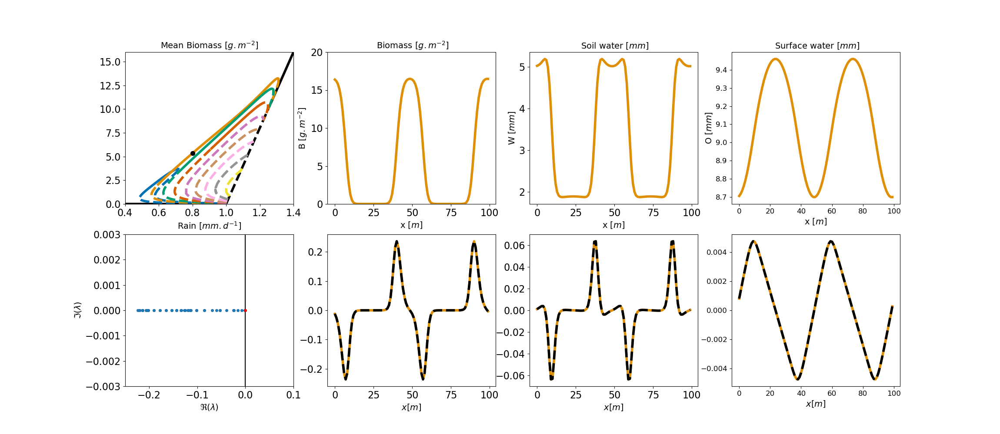

In [20]:
rain=0.8
eps=0.001
n=0
n_mode=2
ind=selec_rain(rain,5,10,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))

#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)


x=x/(2*np.pi)*L
fig,ax=plt.subplots(2,4,figsize=(23,10))
for i in range(N_mode-7):
    ax[0,0].plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i],linewidth=4)
    ax[0,0].plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=8,color=color_mode[i],label=name_mode[i],linewidth=4)  
ax[0,0].set_xlim(0.4,1.4)
ax[0,0].set_ylim(0,16)
ax[0,0].plot(Rains_mode_tot[n_mode][ind],np.mean(P_mode_tot[n_mode][ind]),marker='o',color='black',linestyle='none',label='Solution shown',markersize=7)
ax[0,0].set_title('Mean Biomass $[g.m^{-2}]$',fontsize=14)
ax[0,0].set_xlabel('Rain $[mm.d^{-1}]$',fontsize=14)
#ax[0].legend(bbox_to_anchor=(-0.1,0.3))
ax[0,1].plot(x,np.squeeze(P_mode_tot[n_mode][ind]),color=color_mode[n_mode],linewidth=4)
ax[0,1].set_title(' Biomass $[g.m^{-2}]$',fontsize=14)
ax[0,1].set_xlabel('x $[m]$',fontsize=14)
ax[0,1].set_ylabel('B $[g.m^{-2}]$',fontsize=14)
ax[0,1].set_ylim((0,20))
ax[0,2].plot(x,np.squeeze(W_mode_tot[n_mode][ind]),color=color_mode[n_mode],linewidth=4)
ax[0,2].set_title(' Soil water $[mm]$',fontsize=14)
ax[0,2].set_xlabel('x $[m]$',fontsize=14)
ax[0,2].set_ylabel('W $[mm]$',fontsize=14)
#ax[2].set_ylim((0,20))
ax[0,3].plot(x,np.squeeze(O_mode_tot[n_mode][ind]),color=color_mode[n_mode],linewidth=4)
ax[0,3].set_title(' Surface water $[mm]$',fontsize=14)
ax[0,3].set_xlabel('x $[m]$',fontsize=14)
ax[0,3].set_ylabel('O $[mm]$',fontsize=14)
#ax[3].set_ylim((0,20))
#######################################
lmb,vec=stability_eigen(P_mode_tot[n_mode][ind,:].T,W_mode_tot[n_mode][ind,:].T,O_mode_tot[n_mode][ind,:].T,Rains_mode_tot[n_mode][ind],L,param)
N=P_mode_tot[n_mode][ind,:].T.shape[0]
print(N)
x=np.arange(0,L,L/N)
dx=L/N
#evaluation of the derivatives
q = (2*np.pi/L)*np.linspace(-int(N/2),int(N/2)-1,N)
P_k=np.fft.fftshift(np.fft.fft(np.squeeze(P_mode_tot[n_mode][ind])))
dPdx=np.fft.ifft(np.fft.ifftshift(1j*q*P_k))
W_k=np.fft.fftshift(np.fft.fft(np.squeeze(W_mode_tot[n_mode][ind])))
dWdx=np.fft.ifft(np.fft.ifftshift(1j*q*W_k))
O_k=np.fft.fftshift(np.fft.fft(np.squeeze(O_mode_tot[n_mode][ind])))
dOdx=np.fft.ifft(np.fft.ifftshift(1j*q*O_k))

ratioP=np.max(dPdx)/np.max(np.real(vec[:N,0]))
ratioW=np.max(dWdx)/np.max(np.real(vec[N:2*N,0]))
ratioO=np.max(dOdx)/np.max(np.real(vec[2*N:,0]))

ax[1,0].plot(np.real(lmb)[:50],np.imag(lmb)[:50],marker='o',linestyle='none',markersize=4)
ax[1,0].plot(np.real(lmb)[0],np.imag(lmb)[0],marker='o',linestyle='none',color='red',markersize=4)
ax[1,0].set_xlim((-0.25,0.1))
ax[1,0].set_xlabel('$\Re (\lambda)$',fontsize=14)
ax[1,0].set_ylabel('$\Im (\lambda)$',fontsize=14)
ax[1,0].vlines(0,-1,1,color='black')
ax[1,0].set_ylim((-0.003,0.003))
#plt.savefig('eigenV.png')
ax[1,1].plot(x,np.real(vec[:N,0]),label='Biomass',linewidth=4,color=color_mode[n_mode])
ax[1,1].plot(x,dPdx/ratioP,color='black',linestyle='dashed',linewidth=4)
#ax[1].set_title('$\lambda $=  %.3f+(%.3f)i '%(lmb[0].real,lmb[0].imag))
ax[1,1].set_xlabel('$x [m]$',fontsize=14)
ax[1,2].plot(x,np.real(vec[N:2*N,0]),label='Soil water',linewidth=4,color=color_mode[n_mode])
ax[1,2].plot(x,dWdx/ratioW,color='black',linestyle='dashed',linewidth=4)
ax[1,2].set_xlabel('$x [m]$',fontsize=14)
ax[1,3].plot(x,np.real(vec[2*N:,0]),label='Surface water',linewidth=4,color=color_mode[n_mode])
ax[1,3].plot(x,dOdx/ratioO,color='black',linestyle='dashed',linewidth=4)
ax[1,3].set_xlabel('$x [m]$',fontsize=14)

ax[0,0].tick_params(axis='both', which='major', labelsize=16)
ax[0,1].tick_params(axis='both', which='major', labelsize=16)
ax[0,2].tick_params(axis='both', which='major', labelsize=16)
ax[1,0].tick_params(axis='both', which='major', labelsize=16)
ax[1,1].tick_params(axis='both', which='major', labelsize=16)
ax[1,2].tick_params(axis='both', which='major', labelsize=16)


fig.savefig('figure/n=2_09+eig.pdf',dpi=500,bbox_inches='tight')

100
100


/opt/easybuild/soft/2021b/software/matplotlib/3.4.3-foss-2021b/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/opt/easybuild/soft/2021b/software/matplotlib/3.4.3-foss-2021b/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/opt/easybuild/soft/2021b/software/matplotlib/3.4.3-foss-2021b/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0.5, 0, '$x [m]$')

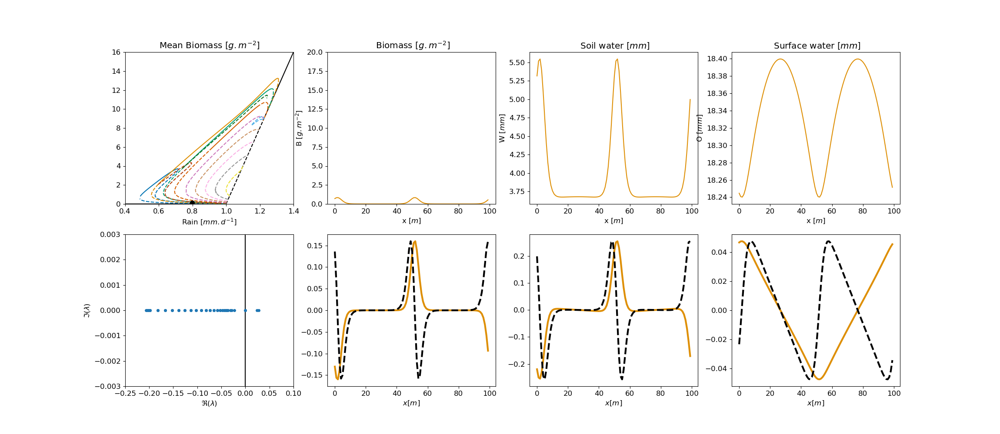

In [18]:
rain=0.8
eps=0.001
n=0
n_mode=2
ind=selec_rain(rain,0.01,2,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))

#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)


x=x/(2*np.pi)*L
fig,ax=plt.subplots(2,4,figsize=(23,10))
for i in range(N_mode-4):
    ax[0,0].plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i])
    ax[0,0].plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=8,color=color_mode[i],label=name_mode[i])  
ax[0,0].set_xlim(0.4,1.4)
ax[0,0].set_ylim(0,16)
ax[0,0].plot(Rains_mode_tot[n_mode][ind],np.mean(P_mode_tot[n_mode][ind]),marker='o',color='black',linestyle='none',label='Solution shown',markersize=7)
ax[0,0].set_title('Mean Biomass $[g.m^{-2}]$')
ax[0,0].set_xlabel('Rain $[mm.d^{-1}]$')
#ax[0].legend(bbox_to_anchor=(-0.1,0.3))
ax[0,1].plot(x,np.squeeze(P_mode_tot[n_mode][ind]),color=color_mode[n_mode])
ax[0,1].set_title(' Biomass $[g.m^{-2}]$')
ax[0,1].set_xlabel('x $[m]$')
ax[0,1].set_ylabel('B $[g.m^{-2}]$')
ax[0,1].set_ylim((0,20))
ax[0,2].plot(x,np.squeeze(W_mode_tot[n_mode][ind]),color=color_mode[n_mode])
ax[0,2].set_title(' Soil water $[mm]$')
ax[0,2].set_xlabel('x $[m]$')
ax[0,2].set_ylabel('W $[mm]$')
#ax[2].set_ylim((0,20))
ax[0,3].plot(x,np.squeeze(O_mode_tot[n_mode][ind]),color=color_mode[n_mode])
ax[0,3].set_title(' Surface water $[mm]$')
ax[0,3].set_xlabel('x $[m]$')
ax[0,3].set_ylabel('O $[mm]$')
#ax[3].set_ylim((0,20))
#######################################
lmb,vec=stability_eigen(P_mode_tot[n_mode][ind,:].T,W_mode_tot[n_mode][ind,:].T,O_mode_tot[n_mode][ind,:].T,Rains_mode_tot[n_mode][ind],L,param)
N=P_mode_tot[n_mode][ind,:].T.shape[0]
print(N)
x=np.arange(0,L,L/N)
dx=L/N
#evaluation of the derivatives
q = (2*np.pi/L)*np.linspace(-int(N/2),int(N/2)-1,N)
P_k=np.fft.fftshift(np.fft.fft(np.squeeze(P_mode_tot[n_mode][ind])))
dPdx=np.fft.ifft(np.fft.ifftshift(1j*q*P_k))
W_k=np.fft.fftshift(np.fft.fft(np.squeeze(W_mode_tot[n_mode][ind])))
dWdx=np.fft.ifft(np.fft.ifftshift(1j*q*W_k))
O_k=np.fft.fftshift(np.fft.fft(np.squeeze(O_mode_tot[n_mode][ind])))
dOdx=np.fft.ifft(np.fft.ifftshift(1j*q*O_k))

ratioP=np.max(dPdx)/np.max(np.real(vec[:N,0]))
ratioW=np.max(dWdx)/np.max(np.real(vec[N:2*N,0]))
ratioO=np.max(dOdx)/np.max(np.real(vec[2*N:,0]))

ax[1,0].plot(np.real(lmb)[:50],np.imag(lmb)[:50],marker='o',linestyle='none',markersize=4)
ax[1,0].set_xlim((-0.25,0.1))
ax[1,0].set_xlabel('$\Re (\lambda)$')
ax[1,0].set_ylabel('$\Im (\lambda)$')
ax[1,0].vlines(0,-1,1,color='black')
ax[1,0].set_ylim((-0.003,0.003))
#plt.savefig('eigenV.png')
ax[1,1].plot(x,np.real(vec[:N,0]),label='Biomass',linewidth=3,color=color_mode[n_mode])
ax[1,1].plot(x,dPdx/ratioP,color='black',linestyle='dashed',linewidth=3)
#ax[1].set_title('$\lambda $=  %.3f+(%.3f)i '%(lmb[0].real,lmb[0].imag))
ax[1,1].set_xlabel('$x [m]$')
ax[1,2].plot(x,np.real(vec[N:2*N,0]),label='Soil water',linewidth=3,color=color_mode[n_mode])
ax[1,2].plot(x,dWdx/ratioW,color='black',linestyle='dashed',linewidth=3)
ax[1,2].set_xlabel('$x [m]$')
ax[1,3].plot(x,np.real(vec[2*N:,0]),label='Surface water',linewidth=3,color=color_mode[n_mode])
ax[1,3].plot(x,dOdx/ratioO,color='black',linestyle='dashed',linewidth=3)
ax[1,3].set_xlabel('$x [m]$')
#fig.savefig('figure/n=2_09+eig.pdf',dpi=500,bbox_inches='tight')

# Start from unstable mode (n=5)
Essai rain=1.05

In [21]:
rain=1.05
eps=0.01
n=0
n_mode=5
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
print(ind)
#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)
#Temporal grid
tmax=15000
M=tmax*100+1
dt=tmax/(M-1)
Dt=10
t=np.linspace(0,tmax,M)
#precipitation
R=Rains_mode_tot[n_mode][ind]
rain=R
Rf=R
prec=(R-Rf)*(1/(1+np.exp(0.001*(t-3000))))+Rf
#prec=R*np.ones(M)
#initial condition
lmb,vec=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
P0=P_mode_tot[n_mode][ind]*1+eps*np.real(vec[:N,n])
W0=W_mode_tot[n_mode][ind]*1+eps*np.real(vec[N:2*N,n])
O0=O_mode_tot[n_mode][ind]*1+eps*np.real(vec[2*N:,n])
Sol=[]
n_run=1
for i in range(n_run):
    P_full,W_full,O_full,R_full,t=VegModelII_Riet_Spec_1D_02pi(L,N,M,tmax,dt,Dt,prec,P0+0*np.random.rand(N),W0+0*np.random.rand(N),O0+0*np.random.rand(N),param)
    Sol.append([P_full,W_full,O_full,R_full,t])
    

54
100


[]
[]


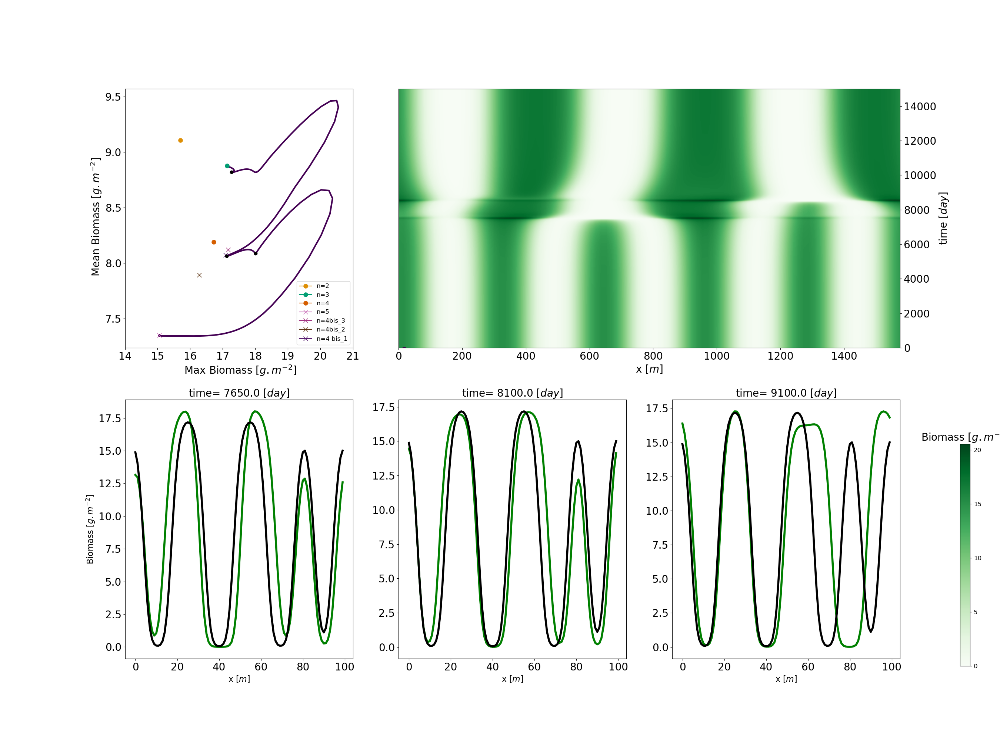

In [29]:
k=np.linspace(0,n_run,n_run+1)
norm = matplotlib.colors.Normalize(vmin=np.min(k),vmax=np.max(k))
# choose a colormap
c_m = matplotlib.cm.viridis
# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=c_m, norm=norm)
            
L=100    
x=np.arange(0,2*np.pi,dx)*(L/(2*np.pi))

fig=plt.figure(figsize=(27,20))
gs = GridSpec(2, 3, width_ratios=[2, 2, 2], height_ratios=[1, 1])
# Create axes for the first row
ax1 = plt.subplot(gs[0, 0])
ax2 = plt.subplot(gs[0, 1:3])

# Create axes for the second row
ax3 = plt.subplot(gs[1, 0])
ax4 = plt.subplot(gs[1, 1])
ax5 = plt.subplot(gs[1, 2])

xx,tt=np.meshgrid(x*(L/(2*np.pi)),t)
for i in range(n_run):
    ax1.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]),linewidth=3)
    ax2.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]),linewidth=3)
    c=np.linspace(-.001,np.max(np.max(Sol[0][0])),201)
    contB=ax2.contourf(xx,tt,Sol[i][0],c,cmap=cm.Greens)
    cax = plt.axes([0.96, 0.1,0.01,0.3])    
    ticks_cbar=np.linspace(0,int(np.max(Sol[0][0])),5)
    cbar=plt.colorbar(contB,cax=cax,orientation='vertical',ticks=ticks_cbar)
    cbar.ax.set_title('Biomass $[g.m^{-2}]$',fontsize=20)
    ax2.set_xlabel('x $[m]$',fontsize=20)
    ax2.set_ylabel('time $[day]$',fontsize=20)
    ax2.yaxis.set_label_position("right")
    ax2.yaxis.tick_right()

ax1.set_xlabel(' Max Biomass $[g.m^{-2}]$',fontsize=20)
ax1.set_ylabel(' Mean Biomass $[g.m^{-2}]$',fontsize=20)
ax1.set_xlim((14,21))

j=0
Equi=[]
Equi2=[]
Stat_sol=[]


for n_mode in [2,3,4,5,-1,-2,-3]:
    ind=selec_rain(rain,5,15,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
    #interpolate to rain
    #print(n_mode)
    rain_inter=np.squeeze([Rains_mode_tot[n_mode][ind-1],Rains_mode_tot[n_mode][ind+1]])
    max_inter=np.squeeze([np.max(P_mode_tot[n_mode][ind-1]),np.max(P_mode_tot[n_mode][ind+1])])
    mean_inter=np.squeeze([np.mean(P_mode_tot[n_mode][ind-1]),np.mean(P_mode_tot[n_mode][ind+1])])
    #print(rain_inter)
    #print(max_inter)
    #print(mean_inter)
    equi_max=np.interp(rain,rain_inter,max_inter)
    equi_mean=np.interp(rain,rain_inter,mean_inter)
    Stat_sol.append(find_next_solution(rain,n_mode,5,15,L,param,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot))
    #print(equi_max)
    #print(equi_mean)
    if Stab_mode_tot[n_mode][ind]==True:
        mark='x'
    else:
        mark='o'
    ax1.plot(np.max(Stat_sol[-1][1]),np.mean(Stat_sol[-1][1]),color=color_mode[n_mode],marker=mark,markersize=8,label=name_mode[n_mode])
    j=j+1
print(np.squeeze(Equi))
print(np.squeeze(Equi2))
ax1.legend()

T=[7650,8100,9100]
t_i=[]
for i in range(len(T)):
    t_i.append(selec_time(T[i],t))

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[0]],np.mean(Sol[0][0],axis=1)[t_i[0]],marker='o',color='black')
ax1.plot(np.max(Sol[0][0],axis=1)[t_i[1]],np.mean(Sol[0][0],axis=1)[t_i[1]],marker='o',color='black')
ax1.plot(np.max(Sol[0][0],axis=1)[t_i[2]],np.mean(Sol[0][0],axis=1)[t_i[2]],marker='o',color='black')

ax3.plot(x,Sol[0][0][t_i[0],:],color='green',linewidth=4)
ax4.plot(x,Sol[0][0][t_i[1],:],color='green',linewidth=4)
ax5.plot(x,Sol[0][0][t_i[2],:],color='green',linewidth=4)

R_4bis,P_4bis,W_4bis,O_4bis=find_next_solution(rain,-1,5,10,L,param,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot)
P_4bis_perm2=period_perm(P_4bis,72)

ax3.plot(x,P_4bis_perm2,label='n= 4 bis',color='black',linewidth=4)
ax4.plot(x,P_4bis_perm2,label='n= 4 bis',color='black',linewidth=4)
ax5.plot(x,P_4bis_perm2,label='n= 4 bis',color='black',linewidth=4)

#ax3.legend()
#ax3.set_ylim((0,20))

ax3.set_xlabel('x $[m]$',fontsize=16)
ax4.set_xlabel('x $[m]$',fontsize=16)
ax5.set_xlabel('x $[m]$',fontsize=16)
ax3.set_ylabel('Biomass $[g.m^{-2}]$',fontsize=16)

ax3.set_title('time= %.1f $[day]$'%(t[t_i[0]]),fontsize=20)
ax4.set_title('time= %.1f $[day]$'%(t[t_i[1]]),fontsize=20)
ax5.set_title('time= %.1f $[day]$'%(t[t_i[2]]),fontsize=20)

ax1.tick_params(axis='both', which='major', labelsize=20)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax3.tick_params(axis='both', which='major', labelsize=20)
ax4.tick_params(axis='both', which='major', labelsize=20)
ax5.tick_params(axis='both', which='major', labelsize=20)


plt.savefig('figure/Unstable.png',dpi=300,bbox_inches='tight')

In [44]:
rain=1.05
n_mode=5
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
lmb_5,vec_5=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
n_mode=-1
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
lmb_4bis_3,vec_4bis_3=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
n_mode=-2
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
lmb_4bis_2,vec_4bis_2=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
n_mode=-3
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
lmb_4bis_1,vec_4bis_1=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)

print('Eigenvalues n=5')
print(lmb_5[:5])
print('Time scale n=5')
print(1/lmb_5[:5])


print('Eigenvalues n=4 bis_3')
print(lmb_4bis_3[:5])
print('Time scale n=4 bis_3')
print(1/lmb_4bis_3[:5])

print('Eigenvalues n=4 bis_2')
print(lmb_4bis_3[:5])
print('Time scale n=4 bis_2')
print(1/lmb_4bis_3[:5])

print('Eigenvalues n=4 bis_1')
print(lmb_4bis_3[:5])
print('Time scale n=4 bis_1')
print(1/lmb_4bis_3[:5])



100
100
100
100
Eigenvalues n=5
[ 1.00101958e-03+0.00000000e+00j  1.00101958e-03+0.00000000e+00j
  2.00516636e-04+8.76351721e-15j  2.00516636e-04-8.76351721e-15j
 -1.90068499e-09+0.00000000e+00j]
Time scale n=5
[ 9.98981456e+02+0.00000000e+00j  9.98981456e+02+0.00000000e+00j
  4.98711737e+03-2.17960413e-07j  4.98711737e+03+2.17960413e-07j
 -5.26126109e+08-0.00000000e+00j]
Eigenvalues n=4 bis_3
[ 1.15842309e-03+0.j  7.12783244e-04+0.j  9.36993242e-10+0.j
 -6.20240097e-04+0.j -7.98390062e-04+0.j]
Time scale n=4 bis_3
[ 8.63242463e+02+0.j  1.40295105e+03+0.j  1.06724356e+09+0.j
 -1.61227887e+03-0.j -1.25252060e+03-0.j]
Eigenvalues n=4 bis_2
[ 1.15842309e-03+0.j  7.12783244e-04+0.j  9.36993242e-10+0.j
 -6.20240097e-04+0.j -7.98390062e-04+0.j]
Time scale n=4 bis_2
[ 8.63242463e+02+0.j  1.40295105e+03+0.j  1.06724356e+09+0.j
 -1.61227887e+03-0.j -1.25252060e+03-0.j]
Eigenvalues n=4 bis_1
[ 1.15842309e-03+0.j  7.12783244e-04+0.j  9.36993242e-10+0.j
 -6.20240097e-04+0.j -7.98390062e-04+0.j]
Ti

In [29]:
#eps=0.1
#initial condition
#lmb,vec=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
Rain=Sol[0][3][t_i[1]]
Pg=Sol[0][0][t_i[1]]
Wg=Sol[0][1][t_i[1]]
Og=Sol[0][2][t_i[1]]

sols = [[Rain,Pg,Wg,Og]]


Text(0, 0.5, 'O')

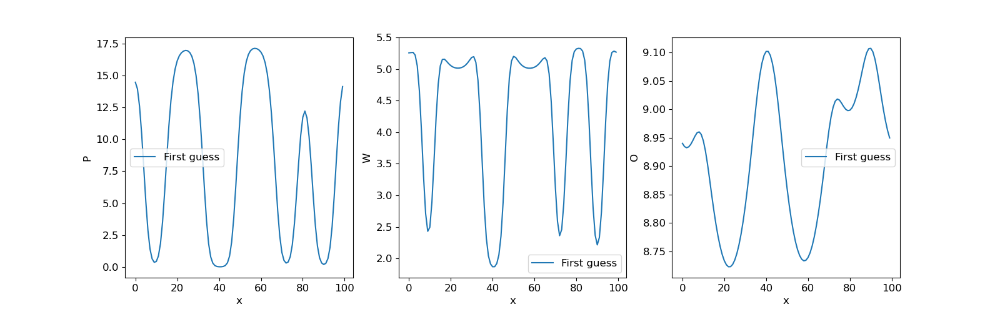

In [30]:
fig,ax=plt.subplots(1,3,figsize=(16,5))
ax[0].plot(x,Pg,label='First guess')
ax[0].legend()
ax[0].set_xlabel('x')
ax[0].set_ylabel('P')
ax[1].plot(x,Wg,label='First guess')
ax[1].legend()
ax[1].set_xlabel('x')
ax[1].set_ylabel('W')
ax[2].plot(x,Og,label='First guess')
ax[2].legend()
ax[2].set_xlabel('x')
ax[2].set_ylabel('O')

In [31]:
Rain=Rain+0.00
Rain,Pnew,Wnew,Onew = newton_iterate(500,Rain,L,param,Pg,Wg,Og,crit_update = 1e-6,crit_source = 1e-10)


failed, Rain=1.0539030970159786


In [ ]:
sols = [[Rain,Pnew,Wnew,Onew]]
Rain,Pg,Wg,Og = sols[-1]
while Rain < 0.84:
    Rain = Rain+0.01
    Rain,Pg,Wg,Og = newton_iterate(500,Rain,L,param,Pg,Wg,Og,crit_update = 1e-4,crit_source = 1e-6)
    sols.append([Rain,Pg,Wg,Og])


In [15]:
n_mode=[-1,-2,-3]
four_bis=[]
for i in range(3):
    four_bis.append(find_next_solution(rain,n_mode[i],5,10,L,param,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot))




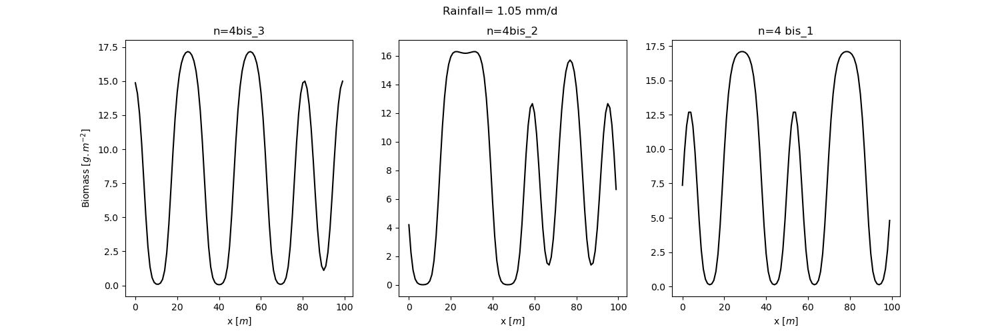

In [16]:

fig,axs=plt.subplots(1,3,figsize=(15,5))
for i in range(3):
    axs[i].plot(x,period_perm(four_bis[i][1],72),color='black')
    axs[i].set_title(name_mode[n_mode[i]])
    axs[i].set_xlabel('x $[m]$')
    
axs[0].set_ylabel('Biomass $[g.m^{-2}]$')
fig.suptitle('Rainfall= %.2f mm/d'%(rain))
plt.savefig('figure/four_bis.png',dpi=300,bbox_inches='tight')

[0 1 2 3 4 5 6 7 8 9]
[4. 5. 6. 7. 8. 9. 0. 0. 0. 0.]
[4. 5. 6. 7. 8. 9. 0. 1. 2. 3.]


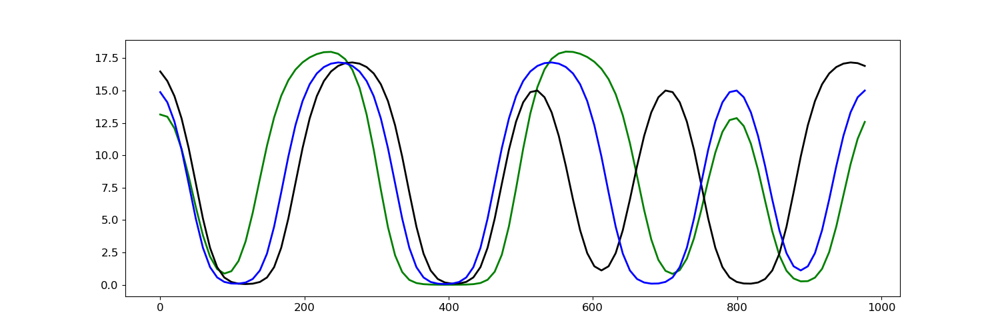

In [27]:
a=np.arange(0,10,1)
N=np.shape(a)[0]
i_perm= 4

abis=np.zeros(np.shape(a))
print(a)
abis[:(N-i_perm)]=a[i_perm:]
print(abis)
abis[(N-i_perm):]=a[:i_perm]
print(abis)


P_4bis_perm1=period_perm(P_4bis,0)
P_4bis_perm2=period_perm(P_4bis,72)

fig,ax=plt.subplots(1,1,figsize=(15,5))
ax.plot(x,Sol[0][0][t_i[0],:],color='green',linewidth=2)
ax.plot(x,P_4bis_perm1,label='n= 4 bis',color='black',linewidth=2)
ax.plot(x,P_4bis_perm2,label='n= 4 bis',color='blue',linewidth=2)


# Start from unstable mode (n=5)
Essai rain=1.1

In [4]:
rain=1.1
eps=0.01
n=0
n_mode=5
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
print(ind)
#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)
#Temporal grid
tmax=30000
M=tmax*100+1
dt=tmax/(M-1)
Dt=10
t=np.linspace(0,tmax,M)
#precipitation
R=Rains_mode_tot[n_mode][ind]
rain=R
Rf=R
prec=(R-Rf)*(1/(1+np.exp(0.001*(t-3000))))+Rf
#prec=R*np.ones(M)
#initial condition
lmb,vec=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
P0=P_mode_tot[n_mode][ind]*1+eps*np.real(vec[:N,n])
W0=W_mode_tot[n_mode][ind]*1+eps*np.real(vec[N:2*N,n])
O0=O_mode_tot[n_mode][ind]*1+eps*np.real(vec[2*N:,n])
Sol=[]
n_run=1
for i in range(n_run):
    P_full,W_full,O_full,R_full,t=VegModelII_Riet_Spec_1D_02pi(L,N,M,tmax,dt,Dt,prec,P0+0*np.random.rand(N),W0+0*np.random.rand(N),O0+0*np.random.rand(N),param)
    Sol.append([P_full,W_full,O_full,R_full,t])
    

41
100


[]
[]


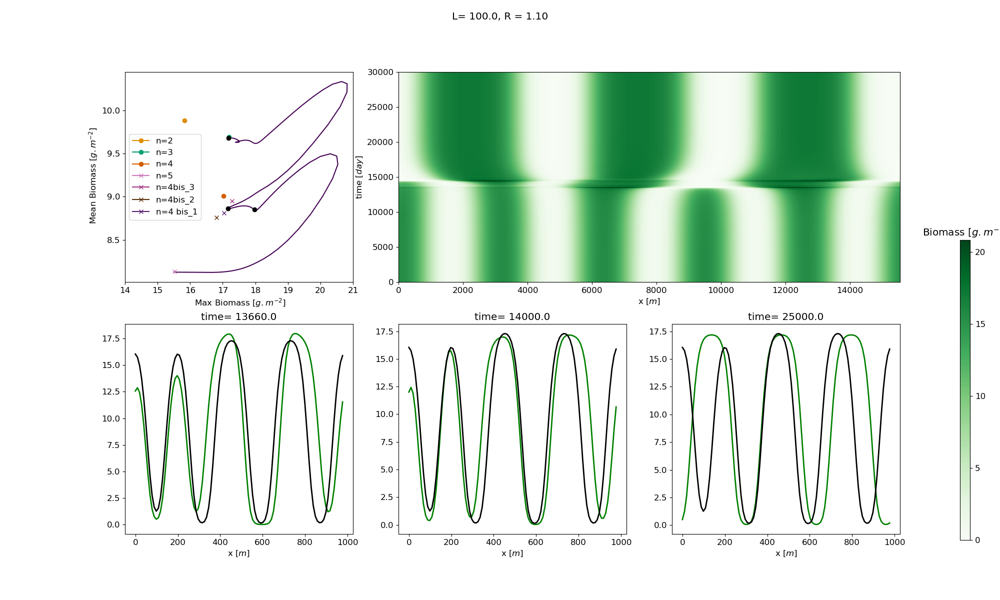

In [44]:
k=np.linspace(0,n_run,n_run+1)
norm = matplotlib.colors.Normalize(vmin=np.min(k),vmax=np.max(k))
# choose a colormap
c_m = matplotlib.cm.viridis
# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=c_m, norm=norm)
            
L=100    
x=np.arange(0,2*np.pi,dx)*(L/(2*np.pi))

fig=plt.figure(figsize=(20,12))
fig.suptitle('L= %.1f, R = %.2f'%(L,rain))
gs = GridSpec(2, 3, width_ratios=[2, 2, 2], height_ratios=[1, 1])
# Create axes for the first row
ax1 = plt.subplot(gs[0, 0])
ax2 = plt.subplot(gs[0, 1:3])

# Create axes for the second row
ax3 = plt.subplot(gs[1, 0])
ax4 = plt.subplot(gs[1, 1])
ax5 = plt.subplot(gs[1, 2])

xx,tt=np.meshgrid(x*(L/(2*np.pi)),t)
for i in range(n_run):
    ax1.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    ax2.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    c=np.linspace(-.001,np.max(np.max(Sol[0][0])),201)
    contB=ax2.contourf(xx,tt,Sol[i][0],c,cmap=cm.Greens)
    cax = plt.axes([0.96, 0.1,0.01,0.5])    
    ticks_cbar=np.linspace(0,int(np.max(Sol[0][0])),5)
    cbar=plt.colorbar(contB,cax=cax,orientation='vertical',ticks=ticks_cbar)
    cbar.ax.set_title('Biomass $[g.m^{-2}]$')
    ax2.set_xlabel('x $[m]$')
    ax2.set_ylabel('time $[day]$')

ax1.set_xlabel(' Max Biomass $[g.m^{-2}]$')
ax1.set_ylabel(' Mean Biomass $[g.m^{-2}]$')
ax1.set_xlim((14,21))

j=0
Equi=[]
Equi2=[]
for n_mode in [2,3,4,5,-1,-2,-3]:
    ind=selec_rain(rain,5,15,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
    #interpolate to rain
    #print(n_mode)
    rain_inter=np.squeeze([Rains_mode_tot[n_mode][ind-1],Rains_mode_tot[n_mode][ind+1]])
    max_inter=np.squeeze([np.max(P_mode_tot[n_mode][ind-1]),np.max(P_mode_tot[n_mode][ind+1])])
    mean_inter=np.squeeze([np.mean(P_mode_tot[n_mode][ind-1]),np.mean(P_mode_tot[n_mode][ind+1])])
    #print(rain_inter)
    #print(max_inter)
    #print(mean_inter)
    equi_max=np.interp(rain,rain_inter,max_inter)
    equi_mean=np.interp(rain,rain_inter,mean_inter)
    #print(equi_max)
    #print(equi_mean)
    if Stab_mode_tot[n_mode][ind]==True:
        mark='x'
    else:
        mark='o'
    ax1.plot(equi_max,equi_mean,color=color_mode[n_mode],marker=mark,label=name_mode[n_mode])
    j=j+1
print(np.squeeze(Equi))
print(np.squeeze(Equi2))
ax1.legend()

T=[13660,14000,25000]
t_i=[]
for i in range(len(T)):
    t_i.append(selec_time(T[i],t))

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[0]],np.mean(Sol[0][0],axis=1)[t_i[0]],marker='o',color='black')

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[1]],np.mean(Sol[0][0],axis=1)[t_i[1]],marker='o',color='black')

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[2]],np.mean(Sol[0][0],axis=1)[t_i[2]],marker='o',color='black')

ax3.plot(x,Sol[0][0][t_i[0],:],color='green',linewidth=2)
ax4.plot(x,Sol[0][0][t_i[1],:],color='green',linewidth=2)
ax5.plot(x,Sol[0][0][t_i[2],:],color='green',linewidth=2)

R_4bis,P_4bis,W_4bis,O_4bis=find_next_solution(rain,-1,5,10,L,param,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot)
P_4bis_perm2=period_perm(P_4bis,51)

ax3.plot(x,P_4bis_perm2,label='n= 4 bis',color='black',linewidth=2)
ax4.plot(x,P_4bis_perm2,label='n= 4 bis',color='black',linewidth=2)
ax5.plot(x,P_4bis_perm2,label='n= 4 bis',color='black',linewidth=2)

#ax3.legend()
#ax3.set_ylim((0,20))

ax3.set_xlabel('x $[m]$')
ax4.set_xlabel('x $[m]$')
ax5.set_xlabel('x $[m]$')

ax3.set_title('time= %.1f'%(t[t_i[0]]))
ax4.set_title('time= %.1f'%(t[t_i[1]]))
ax5.set_title('time= %.1f'%(t[t_i[2]]))

plt.savefig('figure/Unstable2.png',dpi=300,bbox_inches='tight')

[0 1 2 3 4 5 6 7 8 9]
[4. 5. 6. 7. 8. 9. 0. 0. 0. 0.]
[4. 5. 6. 7. 8. 9. 0. 1. 2. 3.]


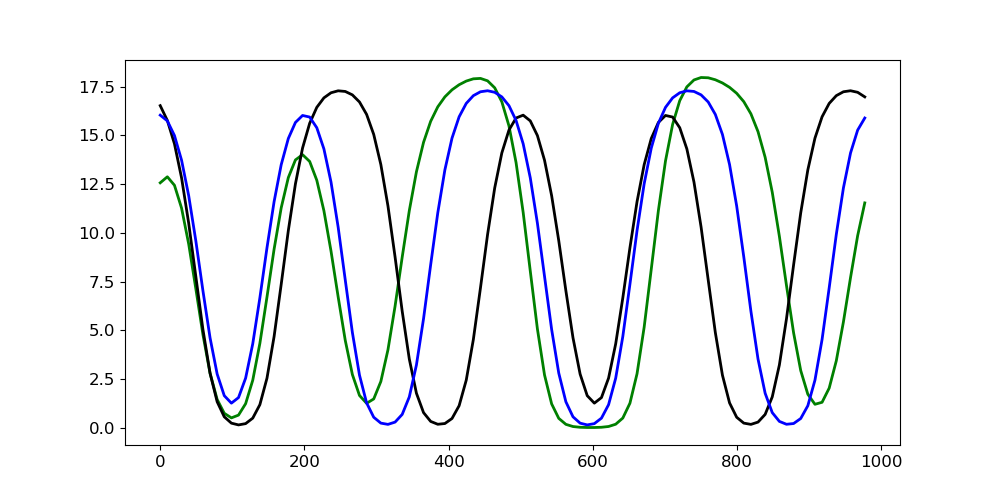

In [43]:
a=np.arange(0,10,1)
N=np.shape(a)[0]
i_perm= 4

abis=np.zeros(np.shape(a))
print(a)
abis[:(N-i_perm)]=a[i_perm:]
print(abis)
abis[(N-i_perm):]=a[:i_perm]
print(abis)


P_4bis_perm1=period_perm(P_4bis,0)
P_4bis_perm2=period_perm(P_4bis,51)

fig,ax=plt.subplots(1,1,figsize=(10,5))
ax.plot(x,Sol[0][0][t_i[0],:],color='green',linewidth=2)
ax.plot(x,P_4bis_perm1,label='n= 4 bis',color='black',linewidth=2)
ax.plot(x,P_4bis_perm2,label='n= 4 bis',color='blue',linewidth=2)


Il y a peut-être un equilibre 4 bis avec trois grands et un petit

In [ ]:
Pg=Sol[0][0][t_i[0],:]
Wg=Sol[0][1][t_i[0],:]
Og=Sol[0][2][t_i[0],:]


Rain,Pnew,Wnew,Onew = newton_iterate(500,rain,L,param,Pg,Wg,Og,crit_update = 1e-6,crit_source = 1e-10)

fig,ax=plt.subplots(1,3,figsize=(20,5))
ax[0].plot(x,Pnew)
ax[0].set_xlabel('x')
ax[0].set_ylabel('P')
ax[0].set_ylabel('Rain')
ax[0].set_ylim((0,20))
ax[1].plot(x,Wnew)
ax[1].set_xlabel('x')
ax[1].set_ylabel('W')
ax[2].plot(x,Onew)
ax[2].set_xlabel('x')
ax[2].set_ylabel('O')

# Start from unstable mode (n=5)
Essai rain=0.8

In [7]:
rain=0.8
eps=0.01
n=0
n_mode=5
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
print(ind)
#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)
#Temporal grid
tmax=30000
M=tmax*100+1
dt=tmax/(M-1)
Dt=10
t=np.linspace(0,tmax,M)
#precipitation
R=Rains_mode_tot[n_mode][ind]
rain=R
Rf=R
prec=(R-Rf)*(1/(1+np.exp(0.001*(t-3000))))+Rf
#prec=R*np.ones(M)
#initial condition
lmb,vec=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
P0=P_mode_tot[n_mode][ind]*1+eps*np.real(vec[:N,n])
W0=W_mode_tot[n_mode][ind]*1+eps*np.real(vec[N:2*N,n])
O0=O_mode_tot[n_mode][ind]*1+eps*np.real(vec[2*N:,n])
Sol=[]
n_run=1
for i in range(n_run):
    P_full,W_full,O_full,R_full,t=VegModelII_Riet_Spec_1D_02pi(L,N,M,tmax,dt,Dt,prec,P0+0*np.random.rand(N),W0+0*np.random.rand(N),O0+0*np.random.rand(N),param)
    Sol.append([P_full,W_full,O_full,R_full,t])
    

41
100


[]
[]


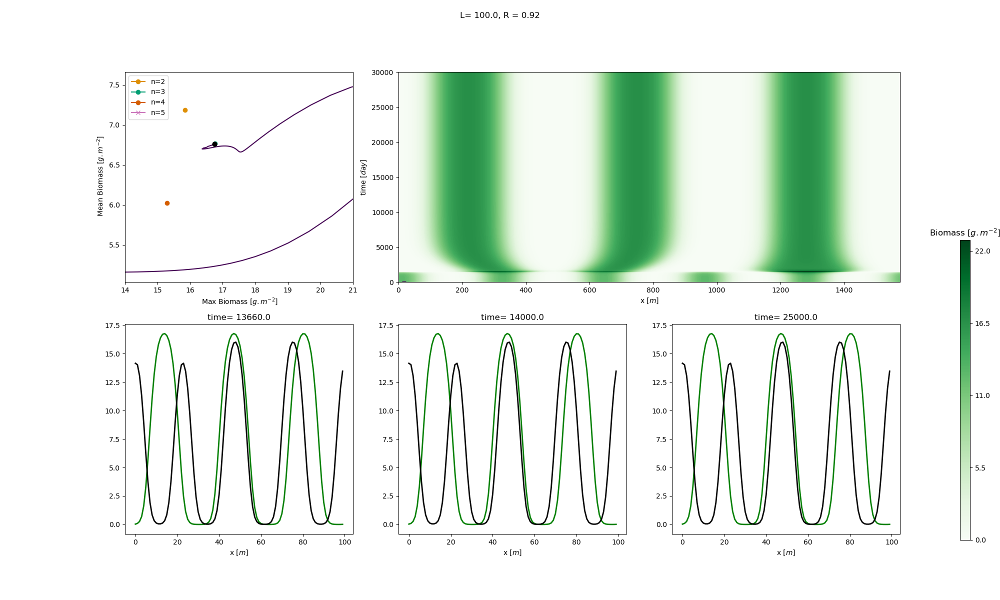

In [8]:
k=np.linspace(0,n_run,n_run+1)
norm = matplotlib.colors.Normalize(vmin=np.min(k),vmax=np.max(k))
# choose a colormap
c_m = matplotlib.cm.viridis
# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=c_m, norm=norm)
            
L=100    
x=np.arange(0,2*np.pi,dx)*(L/(2*np.pi))

fig=plt.figure(figsize=(20,12))
fig.suptitle('L= %.1f, R = %.2f'%(L,rain))
gs = GridSpec(2, 3, width_ratios=[2, 2, 2], height_ratios=[1, 1])
# Create axes for the first row
ax1 = plt.subplot(gs[0, 0])
ax2 = plt.subplot(gs[0, 1:3])

# Create axes for the second row
ax3 = plt.subplot(gs[1, 0])
ax4 = plt.subplot(gs[1, 1])
ax5 = plt.subplot(gs[1, 2])

xx,tt=np.meshgrid(x*(L/(2*np.pi)),t)
for i in range(n_run):
    ax1.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    ax2.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    c=np.linspace(-.001,np.max(np.max(Sol[0][0])),201)
    contB=ax2.contourf(xx,tt,Sol[i][0],c,cmap=cm.Greens)
    cax = plt.axes([0.96, 0.1,0.01,0.5])    
    ticks_cbar=np.linspace(0,int(np.max(Sol[0][0])),5)
    cbar=plt.colorbar(contB,cax=cax,orientation='vertical',ticks=ticks_cbar)
    cbar.ax.set_title('Biomass $[g.m^{-2}]$')
    ax2.set_xlabel('x $[m]$')
    ax2.set_ylabel('time $[day]$')

ax1.set_xlabel(' Max Biomass $[g.m^{-2}]$')
ax1.set_ylabel(' Mean Biomass $[g.m^{-2}]$')
ax1.set_xlim((14,21))

j=0
Equi=[]
Equi2=[]
for n_mode in [2,3,4,5]:
    ind=selec_rain(rain,5,15,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
    #interpolate to rain
    #print(n_mode)
    rain_inter=np.squeeze([Rains_mode_tot[n_mode][ind-1],Rains_mode_tot[n_mode][ind+1]])
    max_inter=np.squeeze([np.max(P_mode_tot[n_mode][ind-1]),np.max(P_mode_tot[n_mode][ind+1])])
    mean_inter=np.squeeze([np.mean(P_mode_tot[n_mode][ind-1]),np.mean(P_mode_tot[n_mode][ind+1])])
    #print(rain_inter)
    #print(max_inter)
    #print(mean_inter)
    equi_max=np.interp(rain,rain_inter,max_inter)
    equi_mean=np.interp(rain,rain_inter,mean_inter)
    #print(equi_max)
    #print(equi_mean)
    if Stab_mode_tot[n_mode][ind]==True:
        mark='x'
    else:
        mark='o'
    ax1.plot(equi_max,equi_mean,color=color_mode[n_mode],marker=mark,label=name_mode[n_mode])
    j=j+1
print(np.squeeze(Equi))
print(np.squeeze(Equi2))
ax1.legend()

T=[13660,14000,25000]
t_i=[]
for i in range(len(T)):
    t_i.append(selec_time(T[i],t))

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[0]],np.mean(Sol[0][0],axis=1)[t_i[0]],marker='o',color='black')

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[1]],np.mean(Sol[0][0],axis=1)[t_i[1]],marker='o',color='black')

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[2]],np.mean(Sol[0][0],axis=1)[t_i[2]],marker='o',color='black')

ax3.plot(x,Sol[0][0][t_i[0],:],color='green',linewidth=2)
ax4.plot(x,Sol[0][0][t_i[1],:],color='green',linewidth=2)
ax5.plot(x,Sol[0][0][t_i[2],:],color='green',linewidth=2)

R_4bis,P_4bis,W_4bis,O_4bis=find_next_solution(rain,-1,5,10,L,param,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot)
P_4bis_perm2=period_perm(P_4bis,51)

ax3.plot(x,P_4bis_perm2,label='n= 4 bis',color='black',linewidth=2)
ax4.plot(x,P_4bis_perm2,label='n= 4 bis',color='black',linewidth=2)
ax5.plot(x,P_4bis_perm2,label='n= 4 bis',color='black',linewidth=2)

#ax3.legend()
#ax3.set_ylim((0,20))

ax3.set_xlabel('x $[m]$')
ax4.set_xlabel('x $[m]$')
ax5.set_xlabel('x $[m]$')

ax3.set_title('time= %.1f'%(t[t_i[0]]))
ax4.set_title('time= %.1f'%(t[t_i[1]]))
ax5.set_title('time= %.1f'%(t[t_i[2]]))

plt.savefig('figure/Unstable3.png',dpi=300,bbox_inches='tight')

[0 1 2 3 4 5 6 7 8 9]
[4. 5. 6. 7. 8. 9. 0. 0. 0. 0.]
[4. 5. 6. 7. 8. 9. 0. 1. 2. 3.]


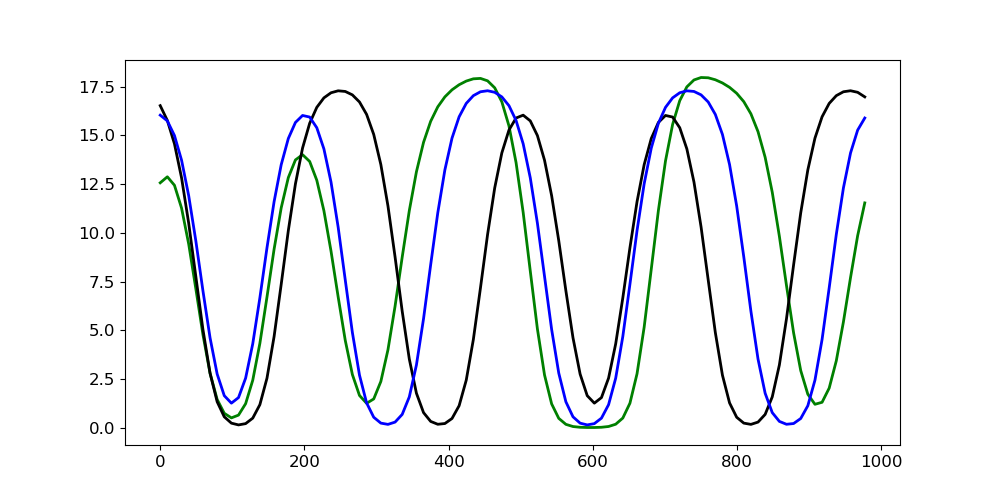

In [43]:
a=np.arange(0,10,1)
N=np.shape(a)[0]
i_perm= 4

abis=np.zeros(np.shape(a))
print(a)
abis[:(N-i_perm)]=a[i_perm:]
print(abis)
abis[(N-i_perm):]=a[:i_perm]
print(abis)


P_4bis_perm1=period_perm(P_4bis,0)
P_4bis_perm2=period_perm(P_4bis,51)

fig,ax=plt.subplots(1,1,figsize=(10,5))
ax.plot(x,Sol[0][0][t_i[0],:],color='green',linewidth=2)
ax.plot(x,P_4bis_perm1,label='n= 4 bis',color='black',linewidth=2)
ax.plot(x,P_4bis_perm2,label='n= 4 bis',color='blue',linewidth=2)


Il y a peut-être un equilibre 4 bis avec trois grands et un petit

In [ ]:
Pg=Sol[0][0][t_i[0],:]
Wg=Sol[0][1][t_i[0],:]
Og=Sol[0][2][t_i[0],:]


Rain,Pnew,Wnew,Onew = newton_iterate(500,rain,L,param,Pg,Wg,Og,crit_update = 1e-6,crit_source = 1e-10)

fig,ax=plt.subplots(1,3,figsize=(20,5))
ax[0].plot(x,Pnew)
ax[0].set_xlabel('x')
ax[0].set_ylabel('P')
ax[0].set_ylabel('Rain')
ax[0].set_ylim((0,20))
ax[1].plot(x,Wnew)
ax[1].set_xlabel('x')
ax[1].set_ylabel('W')
ax[2].plot(x,Onew)
ax[2].set_xlabel('x')
ax[2].set_ylabel('O')

# Start from unstable mode (n=6)
Essai rain=1.05, 1.15

In [ ]:
rain=1.10
eps=0.01
n=0
n_mode=6
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
print(ind)
#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)
#Temporal grid
tmax=30000
M=tmax*100+1
dt=tmax/(M-1)
Dt=10
t=np.linspace(0,tmax,M)
#precipitation
R=Rains_mode_tot[n_mode][ind]
rain=R
Rf=R
prec=(R-Rf)*(1/(1+np.exp(0.001*(t-3000))))+Rf
#prec=R*np.ones(M)
#initial condition
lmb,vec=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
P0=P_mode_tot[n_mode][ind]*1+eps*np.real(vec[:N,n])
W0=W_mode_tot[n_mode][ind]*1+eps*np.real(vec[N:2*N,n])
O0=O_mode_tot[n_mode][ind]*1+eps*np.real(vec[2*N:,n])
Sol=[]
n_run=1
for i in range(n_run):
    P_full,W_full,O_full,R_full,t=VegModelII_Riet_Spec_1D_02pi(L,N,M,tmax,dt,Dt,prec,P0+0*np.random.rand(N),W0+0*np.random.rand(N),O0+0*np.random.rand(N),param)
    Sol.append([P_full,W_full,O_full,R_full,t])
    

In [ ]:
     
k=np.linspace(0,n_run,n_run+1)
norm = matplotlib.colors.Normalize(vmin=np.min(k),vmax=np.max(k))
# choose a colormap
c_m = matplotlib.cm.viridis
# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=c_m, norm=norm)
            
    
x=np.arange(0,2*np.pi,dx)*(L/2*np.pi)

fig=plt.figure(figsize=(20,12))
fig.suptitle('L= %.1f, R = %.2f'%(L,rain))
gs = GridSpec(2, 3, width_ratios=[2, 2, 2], height_ratios=[1, 1])
# Create axes for the first row
ax1 = plt.subplot(gs[0, 0])
ax2 = plt.subplot(gs[0, 1:3])

# Create axes for the second row
ax3 = plt.subplot(gs[1, 0])
ax4 = plt.subplot(gs[1, 1])
ax5 = plt.subplot(gs[1, 2])

xx,tt=np.meshgrid(x*(L/(2*np.pi)),t)
for i in range(n_run):
    ax1.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    ax2.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    c=np.linspace(-.001,np.max(np.max(Sol[0][0])),201)
    contB=ax2.contourf(xx,tt,Sol[i][0],c,cmap=cm.Greens)
    cax = plt.axes([0.96, 0.1,0.01,0.5])    
    ticks_cbar=np.linspace(0,int(np.max(Sol[0][0])),5)
    cbar=plt.colorbar(contB,cax=cax,orientation='vertical',ticks=ticks_cbar)
    cbar.ax.set_title('Biomass $[g.m^{-2}]$')
    ax2.set_xlabel('x $[m]$')
    ax2.set_ylabel('time $[day]$')

ax1.set_xlabel(' Max Biomass $[g.m^{-2}]$')
ax1.set_ylabel(' Mean Biomass $[g.m^{-2}]$')
ax1.set_xlim((10,25))

j=0
Equi=[]
Equi2=[]
for n_mode in [2,3,4,5,6,-1,-2]:
    ind=selec_rain(rain,5,15,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
    #interpolate to rain
    #print(n_mode)
    rain_inter=np.squeeze([Rains_mode_tot[n_mode][ind-1],Rains_mode_tot[n_mode][ind+1]])
    max_inter=np.squeeze([np.max(P_mode_tot[n_mode][ind-1]),np.max(P_mode_tot[n_mode][ind+1])])
    mean_inter=np.squeeze([np.mean(P_mode_tot[n_mode][ind-1]),np.mean(P_mode_tot[n_mode][ind+1])])
    #print(rain_inter)
    #print(max_inter)
    #print(mean_inter)
    equi_max=np.interp(rain,rain_inter,max_inter)
    equi_mean=np.interp(rain,rain_inter,mean_inter)
    #print(equi_max)
    #print(equi_mean)
    if Stab_mode_tot[n_mode][ind]==True:
        mark='x'
    else:
        mark='o'
    ax1.plot(equi_max,equi_mean,color=color_mode[n_mode],marker=mark,label=name_mode[n_mode])
    j=j+1
print(np.squeeze(Equi))
print(np.squeeze(Equi2))
ax1.legend()

T=[1000,6000,10000]
t_i=[]
for i in range(len(T)):
    t_i.append(selec_time(T[i],t))


ax3.plot(x,Sol[0][0][t_i[0],:],color='green',linewidth=2)
ax4.plot(x,Sol[0][0][t_i[1],:],color='green',linewidth=2)
ax5.plot(x,Sol[0][0][t_i[2],:],color='green',linewidth=2)

R_4bis,P_4bis,W_4bis,O_4bis=find_next_solution(rain,-1,5,10,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot)
ax3.plot(x,P_4bis,label='n= 4 bis',color='black',linewidth=2)
ax4.plot(x,P_4bis,label='n= 4 bis',color='black',linewidth=2)
ax5.plot(x,P_4bis,label='n= 4 bis',color='black',linewidth=2)

#ax3.legend()
#ax3.set_ylim((0,20))

ax3.set_xlabel('x $[m]$')
ax4.set_xlabel('x $[m]$')
ax5.set_xlabel('x $[m]$')

ax3.set_title('time= %.1f'%(t[t_i[0]]))
ax4.set_title('time= %.1f'%(t[t_i[1]]))
ax5.set_title('time= %.1f'%(t[t_i[2]]))

plt.savefig('figure/Unstable3.png',dpi=300,bbox_inches='tight')

# Start from unstable mode (n=7)
Essai rain=1.05, 1.15

In [7]:
rain=1.10
eps=0.01
n=0
n_mode=7
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
print(ind)
#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)
#Temporal grid
tmax=30000
M=tmax*100+1
dt=tmax/(M-1)
Dt=10
t=np.linspace(0,tmax,M)
#precipitation
R=Rains_mode_tot[n_mode][ind]
rain=R
Rf=R
prec=(R-Rf)*(1/(1+np.exp(0.001*(t-3000))))+Rf
#prec=R*np.ones(M)
#initial condition
lmb,vec=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
P0=P_mode_tot[n_mode][ind]*1+eps*np.real(vec[:N,n])
W0=W_mode_tot[n_mode][ind]*1+eps*np.real(vec[N:2*N,n])
O0=O_mode_tot[n_mode][ind]*1+eps*np.real(vec[2*N:,n])
Sol=[]
n_run=1
for i in range(n_run):
    P_full,W_full,O_full,R_full,t=VegModelII_Riet_Spec_1D_02pi(L,N,M,tmax,dt,Dt,prec,P0+0*np.random.rand(N),W0+0*np.random.rand(N),O0+0*np.random.rand(N),param)
    Sol.append([P_full,W_full,O_full,R_full,t])
    

40
100


[]
[]


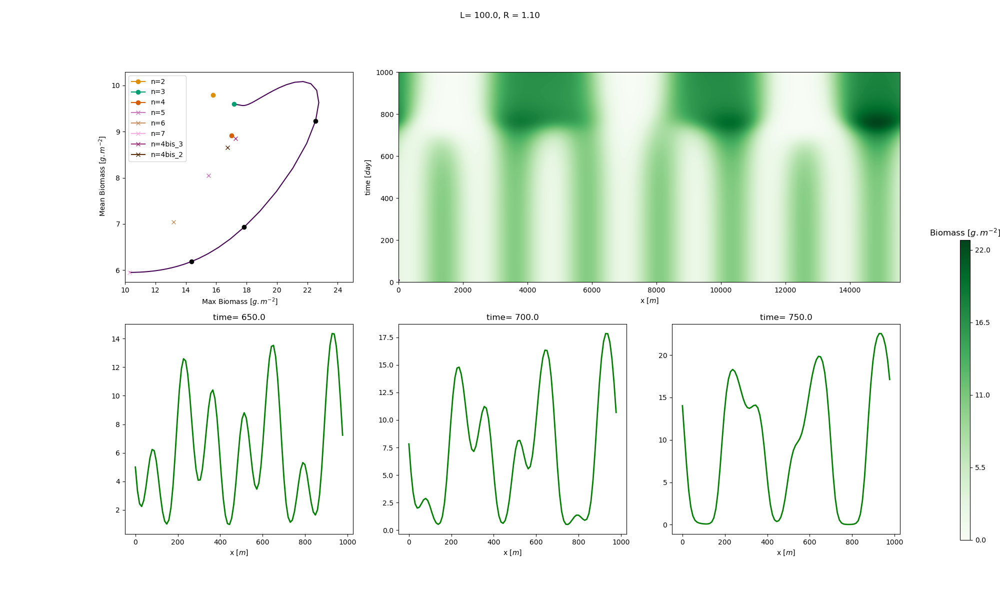

In [12]:
     
k=np.linspace(0,n_run,n_run+1)
norm = matplotlib.colors.Normalize(vmin=np.min(k),vmax=np.max(k))
# choose a colormap
c_m = matplotlib.cm.viridis
# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=c_m, norm=norm)
            
    
x=np.arange(0,2*np.pi,dx)*(L/2*np.pi)

fig=plt.figure(figsize=(20,12))
fig.suptitle('L= %.1f, R = %.2f'%(L,rain))
gs = GridSpec(2, 3, width_ratios=[2, 2, 2], height_ratios=[1, 1])
# Create axes for the first row
ax1 = plt.subplot(gs[0, 0])
ax2 = plt.subplot(gs[0, 1:3])

# Create axes for the second row
ax3 = plt.subplot(gs[1, 0])
ax4 = plt.subplot(gs[1, 1])
ax5 = plt.subplot(gs[1, 2])

xx,tt=np.meshgrid(x*(L/(2*np.pi)),t)
for i in range(n_run):
    ax1.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    ax2.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    c=np.linspace(-.001,np.max(np.max(Sol[0][0])),201)
    contB=ax2.contourf(xx,tt,Sol[i][0],c,cmap=cm.Greens)
    cax = plt.axes([0.96, 0.1,0.01,0.5])    
    ticks_cbar=np.linspace(0,int(np.max(Sol[0][0])),5)
    cbar=plt.colorbar(contB,cax=cax,orientation='vertical',ticks=ticks_cbar)
    cbar.ax.set_title('Biomass $[g.m^{-2}]$')
    ax2.set_xlabel('x $[m]$')
    ax2.set_ylabel('time $[day]$')

ax2.set_ylim((0,1000))
ax1.set_xlabel(' Max Biomass $[g.m^{-2}]$')
ax1.set_ylabel(' Mean Biomass $[g.m^{-2}]$')
ax1.set_xlim((10,25))

j=0
Equi=[]
Equi2=[]
for n_mode in [2,3,4,5,6,7,-1,-2]:
    ind=selec_rain(rain,5,15,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
    #interpolate to rain
    #print(n_mode)
    rain_inter=np.squeeze([Rains_mode_tot[n_mode][ind-1],Rains_mode_tot[n_mode][ind+1]])
    max_inter=np.squeeze([np.max(P_mode_tot[n_mode][ind-1]),np.max(P_mode_tot[n_mode][ind+1])])
    mean_inter=np.squeeze([np.mean(P_mode_tot[n_mode][ind-1]),np.mean(P_mode_tot[n_mode][ind+1])])
    #print(rain_inter)
    #print(max_inter)
    #print(mean_inter)
    equi_max=np.interp(rain,rain_inter,max_inter)
    equi_mean=np.interp(rain,rain_inter,mean_inter)
    #print(equi_max)
    #print(equi_mean)
    if Stab_mode_tot[n_mode][ind]==True:
        mark='x'
    else:
        mark='o'
    ax1.plot(equi_max,equi_mean,color=color_mode[n_mode],marker=mark,label=name_mode[n_mode])
    j=j+1
print(np.squeeze(Equi))
print(np.squeeze(Equi2))
ax1.legend()

T=[650,700,750]
t_i=[]
for i in range(len(T)):
    t_i.append(selec_time(T[i],t))

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[0]],np.mean(Sol[0][0],axis=1)[t_i[0]],marker='o',color='black')

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[1]],np.mean(Sol[0][0],axis=1)[t_i[1]],marker='o',color='black')

ax1.plot(np.max(Sol[0][0],axis=1)[t_i[2]],np.mean(Sol[0][0],axis=1)[t_i[2]],marker='o',color='black')

ax3.plot(x,Sol[0][0][t_i[0],:],color='green',linewidth=2)
ax4.plot(x,Sol[0][0][t_i[1],:],color='green',linewidth=2)
ax5.plot(x,Sol[0][0][t_i[2],:],color='green',linewidth=2)

#R_4bis,P_4bis,W_4bis,O_4bis=find_next_solution(rain,-1,5,10,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot)
#ax3.plot(x,P_4bis,label='n= 4 bis',color='black',linewidth=2)
#ax4.plot(x,P_4bis,label='n= 4 bis',color='black',linewidth=2)
#ax5.plot(x,P_4bis,label='n= 4 bis',color='black',linewidth=2)

#ax3.legend()
#ax3.set_ylim((0,20))

ax3.set_xlabel('x $[m]$')
ax4.set_xlabel('x $[m]$')
ax5.set_xlabel('x $[m]$')

ax3.set_title('time= %.1f'%(t[t_i[0]]))
ax4.set_title('time= %.1f'%(t[t_i[1]]))
ax5.set_title('time= %.1f'%(t[t_i[2]]))

plt.savefig('figure/Unstable4.png',dpi=300,bbox_inches='tight')

# Landing in n=4


In [ ]:
rain=1.13
eps=0.01
n=0
n_mode=5
ind=selec_rain(rain,5,12,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
print(ind)
#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)
#Temporal grid
tmax=15000
M=tmax*100+1
dt=tmax/(M-1)
Dt=10
t=np.linspace(0,tmax,M)
#precipitation
R=Rains_mode_tot[n_mode][ind]
rain=R
Rf=R
prec=(R-Rf)*(1/(1+np.exp(0.001*(t-3000))))+Rf
#prec=R*np.ones(M)
#initial condition
lmb,vec=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
P0=P_mode_tot[n_mode][ind]*0+0*eps*np.real(vec[:N,n])+np.cos(4*x)+1
W0=W_mode_tot[n_mode][ind]*0+0*np.real(vec[N:2*N,n])
O0=O_mode_tot[n_mode][ind]*0+0*np.real(vec[2*N:,n])
Sol=[]
n_run=1
for i in range(n_run):
    P_full,W_full,O_full,R_full,t=VegModelII_Riet_Spec_1D_02pi(L,N,M,tmax,dt,Dt,prec,P0+0*np.random.rand(N),W0+0*np.random.rand(N),O0+0*np.random.rand(N),param)
    Sol.append([P_full,W_full,O_full,R_full,t])
    

In [ ]:
x=np.arange(0,2*np.pi,dx)*(L/2*np.pi)

fig=plt.figure(figsize=(15,10))
fig.suptitle('L= %.1f, R = %.5f'%(L,rain))
ax1=fig.add_subplot(1,2,1)
ax2=fig.add_subplot(1,2,2)

xx,tt=np.meshgrid(x*(L/(2*np.pi)),t)
for i in range(n_run):
    ax1.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    ax2.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]))
    c=np.linspace(-.001,np.max(np.max(Sol[0][0])),201)
    contB=ax2.contourf(xx,tt,Sol[i][0],c,cmap=cm.Greens)
    cax = plt.axes([0.95, 0.1,0.01,0.5])    
    ticks_cbar=np.linspace(0,int(np.max(Sol[0][0])),5)
    cbar=plt.colorbar(contB,cax=cax,orientation='vertical',ticks=ticks_cbar)
    cbar.ax.set_title('Biomass $[g.m^{-2}]$')
    ax2.set_xlabel('x $[m]$')
    ax2.set_ylabel('time $[day]$')

ax1.set_xlabel(' Max Biomass $[g.m^{-2}]$')
ax1.set_ylabel(' Mean Biomass $[g.m^{-2}]$')
ax1.set_xlim((1,25))

j=0
Equi=[]
Equi2=[]
for n_mode in [2,3,4,5,-1,-2]:
    ind=selec_rain(rain,5,15,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
    #interpolate to rain
    #print(n_mode)
    rain_inter=np.squeeze([Rains_mode_tot[n_mode][ind-1],Rains_mode_tot[n_mode][ind+1]])
    max_inter=np.squeeze([np.max(P_mode_tot[n_mode][ind-1]),np.max(P_mode_tot[n_mode][ind+1])])
    mean_inter=np.squeeze([np.mean(P_mode_tot[n_mode][ind-1]),np.mean(P_mode_tot[n_mode][ind+1])])
    #print(rain_inter)
    #print(max_inter)
    #print(mean_inter)
    equi_max=np.interp(rain,rain_inter,max_inter)
    equi_mean=np.interp(rain,rain_inter,mean_inter)
    #print(equi_max)
    #print(equi_mean)
    if Stab_mode_tot[n_mode][ind]==True:
        mark='x'
    else:
        mark='o'
    ax1.plot(equi_max,equi_mean,color=color_mode[n_mode],marker=mark,label=name_mode[n_mode])
    j=j+1
print(np.squeeze(Equi))
print(np.squeeze(Equi2))
ax1.legend()

plt.savefig('figure/road_to_4.png',dpi=300,bbox_inches='tight')

# Random initial conditions

In [52]:
with open("Noise_init/Sol2.bin", "rb") as data:
    Sol = pickle.load(data)
#print(Sol[0])

500
1.1


/tmp/ipykernel_34693/3281950636.py:62: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax1.scatter(equi_max,equi_mean,color=color_mode[n_mode],marker=mark,label=name_mode[n_mode],edgecolors= "black")
/tmp/ipykernel_34693/3281950636.py:63: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax2.scatter(equi_max,equi_mean,color=color_mode[n_mode],marker=mark,label=name_mode[n_mode],edgecolors= "black")


[]
[]


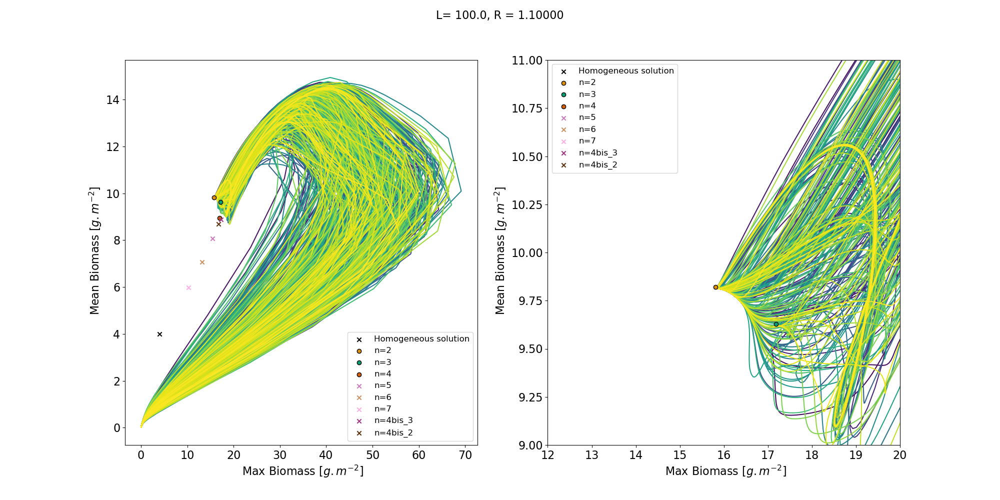

In [54]:
import matplotlib
n_run=len(Sol)
print(n_run)
rain=Sol[0][3][0]
print(rain)
#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)
#Temporal grid
tmax=5000
M=tmax*100+1
dt=tmax/(M-1)
Dt=10
t=np.linspace(0,tmax,M)

k=np.linspace(0,n_run,n_run+1)
norm = matplotlib.colors.Normalize(vmin=np.min(k),vmax=np.max(k))
# choose a colormap
c_m = matplotlib.cm.viridis
# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=c_m, norm=norm)

fig=plt.figure(figsize=(20,10))
fig.suptitle('L= %.1f, R = %.5f'%(L,rain),fontsize=16)
ax1=fig.add_subplot(1,2,1)
ax2=fig.add_subplot(1,2,2)

for i in range(n_run):
    ax1.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]),zorder=-1)
    ax2.plot(np.max(Sol[i][0],axis=1),np.mean(Sol[i][0],axis=1),color=s_m.to_rgba(k[i]),zorder=-1)

ax1.set_xlabel(' Max Biomass $[g.m^{-2}]$',fontsize=16)
ax1.set_ylabel(' Mean Biomass $[g.m^{-2}]$',fontsize=16)
ax2.set_xlabel(' Max Biomass $[g.m^{-2}]$',fontsize=16)
ax2.set_ylabel(' Mean Biomass $[g.m^{-2}]$',fontsize=16)
ax2.set_xlim((12,20))
ax2.set_ylim((9,11))
j=0
Equi=[]
Equi2=[]

for n_mode in [0,2,3,4,5,6,7,-1,-2]:
    ind=selec_rain(rain,0,15,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
    #interpolate to rain
    #print(n_mode)
    rain_inter=np.squeeze([Rains_mode_tot[n_mode][ind-1],Rains_mode_tot[n_mode][ind+1]])
    max_inter=np.squeeze([np.max(P_mode_tot[n_mode][ind-1]),np.max(P_mode_tot[n_mode][ind+1])])
    mean_inter=np.squeeze([np.mean(P_mode_tot[n_mode][ind-1]),np.mean(P_mode_tot[n_mode][ind+1])])
    #print(rain_inter)
    #print(max_inter)
    #print(mean_inter)
    equi_max=np.interp(rain,rain_inter,max_inter)
    equi_mean=np.interp(rain,rain_inter,mean_inter)
    #print(equi_max)
    #print(equi_mean)
    if Stab_mode_tot[n_mode][ind]==True:
        mark='x'
    else:
        mark='o'
    ax1.scatter(equi_max,equi_mean,color=color_mode[n_mode],marker=mark,label=name_mode[n_mode],edgecolors= "black")
    ax2.scatter(equi_max,equi_mean,color=color_mode[n_mode],marker=mark,label=name_mode[n_mode],edgecolors= "black")
    j=j+1

ax1.legend()
ax2.legend()
print(np.squeeze(Equi))
print(np.squeeze(Equi2))
ax1.tick_params(axis='both', which='major', labelsize=16)
ax2.tick_params(axis='both', which='major', labelsize=16)

plt.savefig('figure/random.pdf',dpi=500,bbox_inches='tight')

In [ ]:
rain=0.8
eps=0.0001
n=0
n_mode=5
ind=selec_rain(rain,1,3,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))

#Spatial grid
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)
#Temporal grid
tmax=10
M=tmax*100+1
dt=tmax/(M-1)
Dt=10
t=np.linspace(0,tmax,M)
#precipitation
R=Rains_mode_tot[n_mode][ind]
Rf=0.8
prec=(R-Rf)*(1/(1+np.exp(0.01*(t-2500))))+Rf
prec=R*np.ones(M)
#initial condition
lmb,vec=stability_eigen(P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind],Rains_mode_tot[n_mode][ind],L,param)
P0=P_mode_tot[n_mode][ind,:][0]+eps*np.real(vec[:N,n])
W0=W_mode_tot[n_mode][ind,:][0]+eps*np.real(vec[N:2*N,n])
O0=O_mode_tot[n_mode][ind,:][0]+eps*np.real(vec[2*N:,n])
P_full,W_full,O_full,R_full,t=VegModelII_Riet_Spec_1D_02pi(L,N,M,tmax,dt,Dt,prec,P0,W0,O0,param)

fig1=plot_dynamical_transient(Rains_mode_tot,P_mode_tot,Stab_mode_tot,n_mode,ind,P_full,R_full,x,L,t,name_mode,color_mode,6)
#plt.savefig('fig12.svg')
show_stability_single(R_full[0],P_full[0,:],W_full[0,:],O_full[0,:],param,L)



In [ ]:
def find_next_solution(rain,n_mode,low_P,high_P,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot):
    ind=selec_rain(rain,low_P,high_P,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
    Rain,Pg,Wg,Og = Rains_mode_tot[n_mode][ind],P_mode_tot[n_mode][ind],W_mode_tot[n_mode][ind],O_mode_tot[n_mode][ind]
    Rain,Pnew,Wnew,Onew = newton_iterate(500,rain,L,param,Pg,Wg,Og,crit_update = 1e-6,crit_source = 1e-10)
    return Rain,Pnew,Wnew,Onew



rain=0.99
n_mode=1
ind1=selec_rain(rain,0.02,1,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
R_1,P_1,W_1,O_1=find_next_solution(rain,1,0.02,0.2,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot)
n_mode=2
ind2=selec_rain(rain,0.02,1,Rains_mode_tot[n_mode],np.mean(P_mode_tot[n_mode],axis=1))[0]
R_2,P_2,W_2,O_2=find_next_solution(rain,2,0.02,1,Rains_mode_tot,P_mode_tot,W_mode_tot,O_mode_tot)


In [ ]:
plt.rc('font', size=12) 
Zorder=-np.arange(0,N_mode)
fig,ax=plt.subplots(2,2,figsize=(15,10))
for i in range(N_mode-4):
    ax[0,0].plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i],zorder=Zorder[i])
    ax[0,0].plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=4,color=color_mode[i],label=name_mode[i],linestyle='solid',zorder=Zorder[i])
    ax[0,1].plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i],zorder=Zorder[i])
    ax[0,1].plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=2,color=color_mode[i],label=name_mode[i],zorder=Zorder[i])
ax[0,0].set_xlim(0.4,1.4)
ax[0,0].set_ylim(0,20)
ax[0,0].set_title('Mean Biomass $[g.m^{-2}]$')
ax[0,0].set_xlabel('Rain $[mm.d^{-1}]$')
ax[0,0].legend()
ax[0,1].set_xlim(0.95,1.01)
ax[0,1].set_ylim(0,0.04)
#ax[1].legend()
###############
L=100
N=100
dx=2*np.pi/N
x=np.arange(0,2*np.pi,dx)*(L/2*np.pi)
#Plot the intersection between n=1 et n=2

ax[1,0].plot(x,P_1,color=color_mode[1],label='n=4')
ax[1,0].set_xlabel('x $[m]$')
ax[1,0].set_ylim((0,np.max(P_2)+0.01))
#ax[0,1].scatter(Rains_mode_tot[1][ind1],np.mean(P_mode_tot[1][ind1]),marker='*',color=color_mode[1],edgecolors= "black",s=60)
#ax[0,1].scatter(Rains_mode_tot[2][ind2],np.mean(P_mode_tot[2][ind2]),marker='*',color=color_mode[2],edgecolors= "black",s=60)
ax[0,1].scatter(R_1,np.mean(P_1),marker='*',color=color_mode[1],edgecolors= "black",s=60)
ax[0,1].scatter(R_2,np.mean(P_2),marker='*',color=color_mode[2],edgecolors= "black",s=60)

#ax[1,1].plot(Rains_mode_tot[1][ind-1:ind+1],np.real(Lmb_mode_tot[1][ind1-1:ind1+1,0]),color=color_mode[1],label='n=4')

ax[1,1].plot(Rains_mode_tot[2][:ind2+20],np.real(Lmb_mode_tot[2][:ind2+20,0]),color=color_mode[2],linestyle='dashed')
ax[1,1].plot(Rains_mode_tot[2][:ind2+20],np.real(Lmb_mode_tot[2][:ind2+20,1]),color=color_mode[2])
ax[1,1].plot(Rains_mode_tot[2][:ind2+20],np.real(Lmb_mode_tot[2][:ind2+20,2]),color=color_mode[2])
ax[1,1].plot(Rains_mode_tot[2][:ind2+20],np.real(Lmb_mode_tot[2][:ind2+20,3]),color=color_mode[2])
ax[1,1].vlines(R_1,-1,1,color='black')
ax[1,1].set_ylim((-0.001,0.001))

ax[1,1].plot(Rains_mode_tot[1][ind1-20:],np.real(Lmb_mode_tot[1][ind1-20:,0]),color=color_mode[1],linestyle='dashed')
ax[1,1].plot(Rains_mode_tot[1][ind1-20:],np.real(Lmb_mode_tot[1][ind1-20:,1]),color=color_mode[1])
ax[1,1].plot(Rains_mode_tot[1][ind1-20:],np.real(Lmb_mode_tot[1][ind1-20:,2]),color=color_mode[1])
ax[1,1].plot(Rains_mode_tot[1][ind1-20:],np.real(Lmb_mode_tot[1][ind1-20:,3]),color=color_mode[1])
ax[1,1].set_xlim(0.95,1.01)



# Transient from full vegetated to bare soil

[1.365 1.365 1.365 ... 0.5   0.5   0.5  ]


/tmp/ipykernel_69828/1224444709.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=plt.subplots(1,3,figsize=(58/1.2,10/1.2))


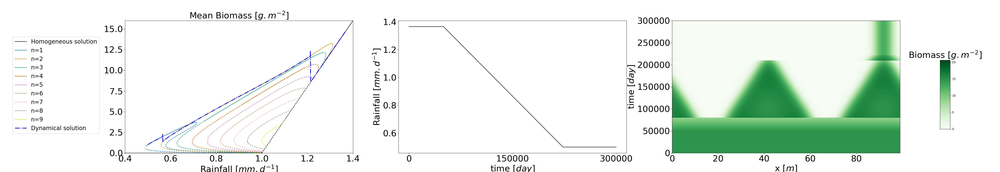

In [25]:
with open("transient/sol.bin", "rb") as fp:
        Sol=pickle.load(fp)

with open("transient/rate.bin", "rb") as fp:
        rate=pickle.load(fp)

n_run=np.shape(rate)[0]
#n_run=1

x=Sol[0][-1]
t=Sol[0][-2]
L=100
xx,tt=np.meshgrid(x*(L/(2*np.pi)),t)

print(Sol[0][3])

fig,ax=plt.subplots(1,3,figsize=(58/1.2,10/1.2))
for i in range(N_mode-7):
    ax[0].plot(np.ma.masked_where(True^Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(True^Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),linestyle='dashed',markersize=1,color=color_mode[i])
    ax[0].plot(np.ma.masked_where(Stab_mode_tot[i], Rains_mode_tot[i]),np.ma.masked_where(Stab_mode_tot[i], np.mean(P_mode_tot[i],axis=1)),markersize=8,color=color_mode[i],label=name_mode[i])  
ax[0].set_xlim(0.4,1.4)
ax[0].set_ylim(0,16)

ax[0].plot(Sol[0][3],np.mean(Sol[0][0],axis=1),color='blue',linestyle='dashdot',label='Dynamical solution',markersize=7,linewidth=2.5)
ax[0].set_title('Mean Biomass $[g.m^{-2}]$',fontsize=30)
ax[0].set_xlabel('Rainfall $[mm.d^{-1}]$',fontsize=30)
ax[1].plot(Sol[0][4],Sol[0][3],color='black')
c=np.linspace(-.001,np.max(np.max(Sol[0][0])),201)
contB=ax[2].contourf(xx,tt,Sol[0][0],c,cmap=cm.Greens)
cax = plt.axes([0.94, 0.25,0.01,0.4])    
ticks_cbar=np.linspace(0,int(np.max(Sol[0][0])),5)
cbar=plt.colorbar(contB,cax=cax,orientation='vertical',ticks=ticks_cbar)
cbar.ax.set_title('Biomass $[g.m^{-2}]$',fontsize=30)
ax[2].set_xlabel('x $[m]$',fontsize=30)
ax[2].set_ylabel('time $[day]$',fontsize=30)
ax[1].set_xlabel('time $[day]$',fontsize=30)
ax[1].set_ylabel('Rainfall $[mm.d^{-1}]$',fontsize=30)
ax[0].legend(bbox_to_anchor=(-0.1,0.9),fontsize=20)
ax[1].ticklabel_format(style='scientific',scilimits=(2,10))
Ticks=[0,150000,300000]
Tickslabel=['0','150000','300000']
ax[1].set_xticks(Ticks)
ax[0].tick_params(axis='both', which='major', labelsize=30)
ax[1].tick_params(axis='both', which='major', labelsize=30)
ax[2].tick_params(axis='both', which='major', labelsize=30)

plt.savefig('figure/transient.png',dpi=200,bbox_inches='tight')



In [39]:
print(rate)

[-5.e-06 -1.e-05 -5.e-05 -8.e-05 -1.e-04]


In [ ]:
def trans_rainfall(t,t_i,t_f,R_i,R_f):
    R=np.zeros(np.shape(t))
    for i in range(np.shape(t)[0]):
        if t[i]<=t_i:
            R[i]=R_i
        elif t[i]>t_i and t[i]<t_f:
            R[i]=(R_f-R_i)/(t_f-t_i)*(t[i]-t_i)+R_i
        else:
            R[i]=R_f
    return(R,(R_f-R_i)/(t_f-t_i))

def selec_time(T,t):
    i=0
    while t[i]<T:
        i=i+1
    return(i)
            
    

tmax=300000
M=tmax*100+1
dt=tmax/(M-1)
Dt=10
t=np.linspace(0,tmax,M)


R_i=1.35
R_f=0.5
t_i=50000
rate=-np.array([0.00001,0.000005,0.0005])
t_f=t_i+(R_f-R_i)/rate
n_run=np.shape(rate)[0]

print(t_f)
prec=np.zeros((n_run,np.shape(t)[0]))
rate=np.zeros(n_run)

for i in range(n_run):
    prec[i,:],rate[i]=trans_rainfall(t,t_i,t_f[i],R_i,R_f)
    rate[i]=(R_f-R_i)/(t_f[i]-t_i)

t_i=selec_time(t_i,t)

fig,ax=plt.subplots(1,1,figsize=(10,10))
for i in range(n_run):
    ax.plot(t,prec[i,:])
    ax.scatter(t[t_i],prec[i,t_i])
    
